# BHANU PRATAP REDDY - 13/11/2022

## Library Imports and QoL Settings

In [571]:
#Importing all necessary Libraries
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pnx
import scipy.stats as stats
from sklearn.impute import SimpleImputer

# For checking errors
from sklearn import metrics

#For Scaling the dataset
from sklearn.preprocessing import scale

#Train -  Test Split
from sklearn.model_selection import train_test_split

#AUC and Confusion Matrix
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

#Librares for Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge,ElasticNet, LassoCV, RidgeCV, ElasticNetCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score,mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

#Libraries for Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder

#Libraries for LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from yellowbrick.classifier import DiscriminationThreshold
from yellowbrick.datasets import load_spam

#Libraries for CART
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree


# Declaring this to show graphs after inline command instead of plt.show() after every instance of plotting
%matplotlib inline

#Set the max number of rows in output cell to 30
pd.options.display.max_rows = 30


#Ignore unnecessary warnings
from warnings import filterwarnings
filterwarnings("ignore")

## Linear Rigression

In [572]:
compactiv_df = pd.read_excel("compactiv.xlsx")
compactiv_df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


### Data Dictionary

**System measures used:**

**lread** - Reads (transfers per second ) between system memory and user memory

**lwrite** - writes (transfers per second) between system memory and user memory

**scall** - Number of system calls of all types per second

**sread** - Number of system read calls per second.

**swrite** - Number of system write calls per second.

**fork** - Number of system fork calls per second.

**exec** - Number of system exec calls per second.

**rchar** - Number of characters transferred per second by system read calls

**wchar** - Number of characters transfreed per second by system write calls

**pgout** - Number of page out requests per second

**ppgout** - Number of pages, paged out per second

**pgfree** - Number of pages per second placed on the free list.

**pgscan** - Number of pages checked if they can be freed per second

**atch** - Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second

**pgin** - Number of page-in requests per second

**ppgin** - Number of pages paged in per second

**pflt** - Number of page faults caused by protection errors (copy-on-writes).

**vflt** - Number of page faults caused by address translation .

**runqsz** - Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.
Typically, this value should be less than 2. Consistently higher values mean that the system might be CPU-bound.)

**freemem** - Number of memory pages available to user processes
**freeswap** - Number of disk blocks available for page swapping.


**usr** - Portion of time (%) that cpus run in user mode

### Exploratory Data Analysis (EDA)

In [573]:
#The size of the dataset is:
print(f"No. of Rows: {compactiv_df.shape[0]}")
print(f"No. of Columns: {compactiv_df.shape[1]}")

No. of Rows: 8192
No. of Columns: 22


In [574]:
compactiv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [575]:
compactiv_df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [576]:
compactiv_df.duplicated().value_counts()

False    8192
dtype: int64

In [577]:
compactiv_df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [578]:
## Imputing missing values with Median since percentatge of missing values is less than 5%
## In numerical column, if there is a missing value/empty cell, we are replacing with median
for column in compactiv_df.columns:
    if compactiv_df[column].dtype != 'object':
        median = compactiv_df[column].median()
        compactiv_df[column] = compactiv_df[column].fillna(median)    
        
compactiv_df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [579]:
compactiv_df.isin([0]).sum()

lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64

In [580]:
## Checking the unquie values for categorical variables. 
for column in compactiv_df.columns:
    if compactiv_df[column].dtype == 'object':
        print(column.upper(),': ',compactiv_df[column].nunique())
        print(compactiv_df[column].value_counts().sort_values())
        print('\n')

RUNQSZ :  2
CPU_Bound        3861
Not_CPU_Bound    4331
Name: runqsz, dtype: int64




In [581]:
## Here we are converting sub-groups/ classes into numbers(0 or 1). This is done as algorithm takes only numbers or its a pre-requisite to run a algorithm
## Drop first will ensure redundancy is removed. For multiple class, It also removes multicollinearity(if any)
compactiv_df = pd.get_dummies(compactiv_df, columns=['runqsz'],drop_first=True)

In [582]:
compactiv_df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.00,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.00,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.00,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.00,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.00,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.40,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.20,1.2,2.800,59.56
rchar,8192.0,1.964728e+05,238446.012054,278.0,34860.50,125473.5,265394.750,2526649.00
wchar,8192.0,9.581275e+04,140728.464118,1498.0,22977.75,46619.0,106037.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.00,0.0,2.400,81.44


In [583]:
compactiv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   int64  
 1   lwrite                8192 non-null   int64  
 2   scall                 8192 non-null   int64  
 3   sread                 8192 non-null   int64  
 4   swrite                8192 non-null   int64  
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8192 non-null   float64
 8   wchar                 8192 non-null   float64
 9   pgout                 8192 non-null   float64
 10  ppgout                8192 non-null   float64
 11  pgfree                8192 non-null   float64
 12  pgscan                8192 non-null   float64
 13  atch                  8192 non-null   float64
 14  pgin                  8192 non-null   float64
 15  ppgin                

In [584]:
compactiv_df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr', 'runqsz_Not_CPU_Bound'],
      dtype='object')

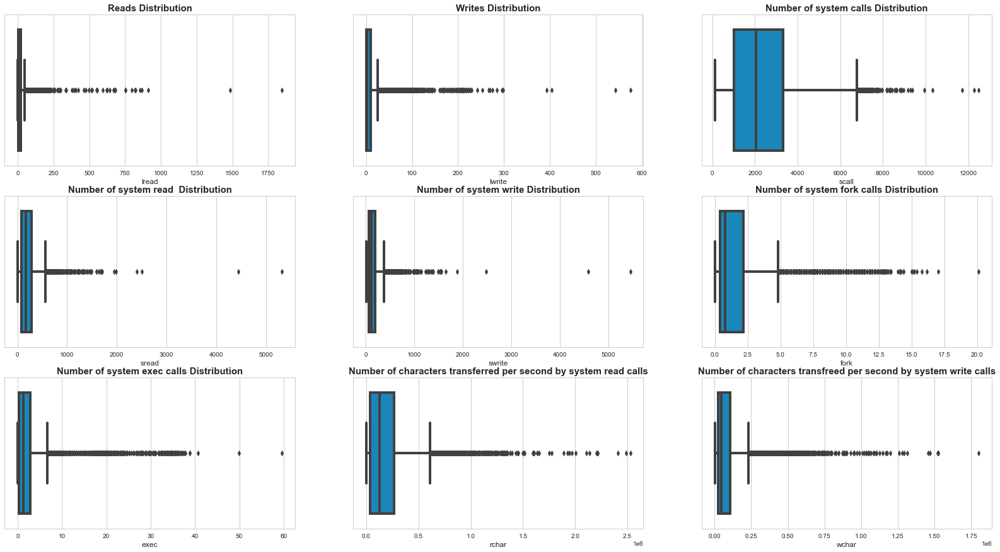

In [585]:
## Checking for Outliers
## Checking if there are any extreme values in the dataset given to us.
plt.figure(figsize =(25,15));
sns.set_style("whitegrid")
plt.subplot(3,3,1); ## Row - Column - Order
plt.title("Reads Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="lread");

plt.subplot(3,3,2); ## Row - Column - Order
plt.title("Writes Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="lwrite");

plt.subplot(3,3,3); ## Row - Column - Order
plt.title("Number of system calls Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="scall");

plt.subplot(3,3,4); ## Row - Column - Order
plt.title("Number of system read  Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="sread");

plt.subplot(3,3,5); ## Row - Column - Order
plt.title("Number of system write Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="swrite");

plt.subplot(3,3,6); ## Row - Column - Order
plt.title("Number of system fork calls Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="fork");

plt.subplot(3,3,7); ## Row - Column - Order
plt.title("Number of system exec calls Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="exec");

plt.subplot(3,3,8); ## Row - Column - Order
plt.title("Number of characters transferred per second by system read calls",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="rchar");

plt.subplot(3,3,9); ## Row - Column - Order
plt.title("Number of characters transfreed per second by system write calls",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="wchar");


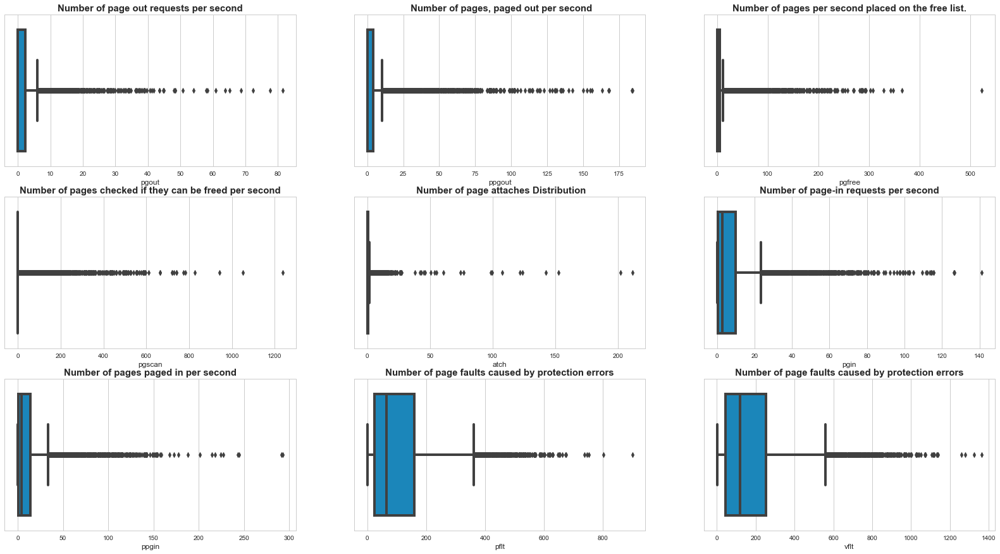

In [586]:
## Checking for Outliers 2
plt.figure(figsize =(25,15));
sns.set_style("whitegrid")
plt.subplot(3,3,1); ## Row - Column - Order
plt.title("Number of page out requests per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgout");

plt.subplot(3,3,2); ## Row - Column - Order
plt.title(" Number of pages, paged out per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="ppgout");

plt.subplot(3,3,3); ## Row - Column - Order
plt.title("Number of pages per second placed on the free list.",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgfree");

plt.subplot(3,3,4); ## Row - Column - Order
plt.title("Number of pages checked if they can be freed per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgscan");

plt.subplot(3,3,5); ## Row - Column - Order
plt.title(" Number of page attaches Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="atch");

plt.subplot(3,3,6); ## Row - Column - Order
plt.title("Number of page-in requests per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgin");

plt.subplot(3,3,7); ## Row - Column - Order
plt.title("Number of pages paged in per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="ppgin");

plt.subplot(3,3,8); ## Row - Column - Order
plt.title(" Number of page faults caused by protection errors ",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pflt");

plt.subplot(3,3,9); ## Row - Column - Order
plt.title(" Number of page faults caused by protection errors ",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="vflt");

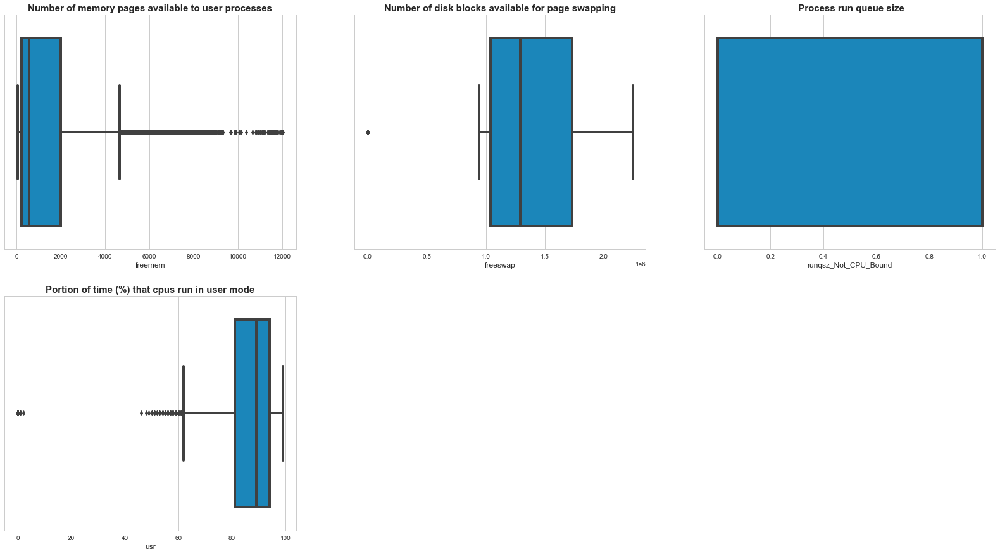

In [587]:
## Checking for Outliers 3
plt.figure(figsize =(25,15));
sns.set_style("whitegrid")
plt.subplot(2,3,1); ## Row - Column - Order
plt.title("Number of memory pages available to user processes",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="freemem");

plt.subplot(2,3,2); ## Row - Column - Order
plt.title("Number of disk blocks available for page swapping",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="freeswap");

plt.subplot(2,3,3); ## Row - Column - Order
plt.title(" Process run queue size",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="runqsz_Not_CPU_Bound");

plt.subplot(2,3,4); ## Row - Column - Order
plt.title("Portion of time (%) that cpus run in user mode",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="usr");

In [588]:
def outlier_treatment(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [589]:
col_df = ['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar','wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin','pflt', 'vflt', 'freemem', 'freeswap', 'usr']
for i in range(0,len(col_df)):
    lr,ur = outlier_treatment(compactiv_df[col_df[i]])
    compactiv_df[col_df[i]] =np.where(compactiv_df[col_df[i]]>ur,ur,compactiv_df[col_df[i]])
    compactiv_df[col_df[i]] =np.where(compactiv_df[col_df[i]]<lr,lr,compactiv_df[col_df[i]])

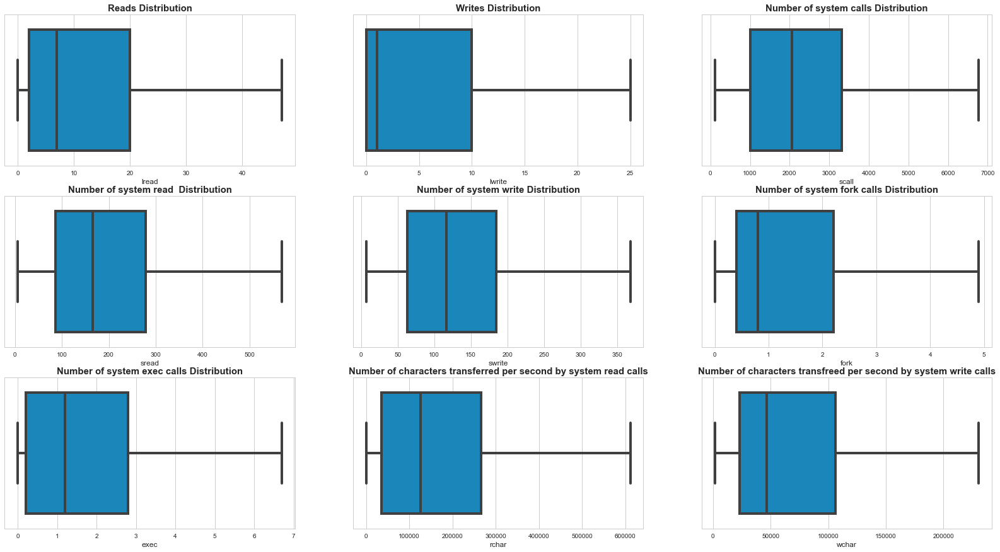

In [590]:
## Outlier check after treatment
plt.figure(figsize =(25,15));
sns.set_style("whitegrid")
plt.subplot(3,3,1); ## Row - Column - Order
plt.title("Reads Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="lread");

plt.subplot(3,3,2); ## Row - Column - Order
plt.title("Writes Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="lwrite");

plt.subplot(3,3,3); ## Row - Column - Order
plt.title("Number of system calls Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="scall");

plt.subplot(3,3,4); ## Row - Column - Order
plt.title("Number of system read  Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="sread");

plt.subplot(3,3,5); ## Row - Column - Order
plt.title("Number of system write Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="swrite");

plt.subplot(3,3,6); ## Row - Column - Order
plt.title("Number of system fork calls Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="fork");

plt.subplot(3,3,7); ## Row - Column - Order
plt.title("Number of system exec calls Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="exec");

plt.subplot(3,3,8); ## Row - Column - Order
plt.title("Number of characters transferred per second by system read calls",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="rchar");

plt.subplot(3,3,9); ## Row - Column - Order
plt.title("Number of characters transfreed per second by system write calls",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="wchar");


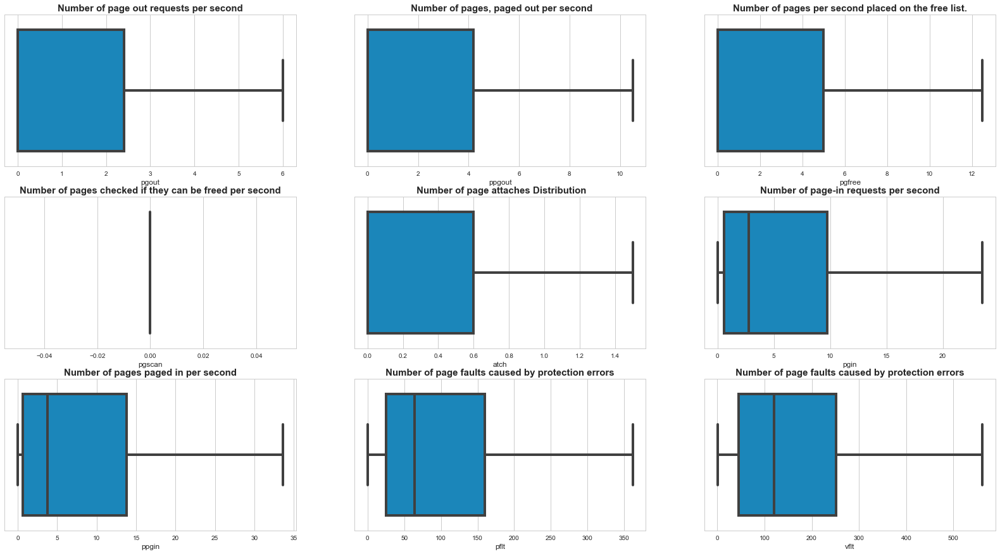

In [591]:
## Outlier check after treatment 2
plt.figure(figsize =(25,15));
sns.set_style("whitegrid")
plt.subplot(3,3,1); ## Row - Column - Order
plt.title("Number of page out requests per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgout");

plt.subplot(3,3,2); ## Row - Column - Order
plt.title(" Number of pages, paged out per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="ppgout");

plt.subplot(3,3,3); ## Row - Column - Order
plt.title("Number of pages per second placed on the free list.",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgfree");

plt.subplot(3,3,4); ## Row - Column - Order
plt.title("Number of pages checked if they can be freed per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgscan");

plt.subplot(3,3,5); ## Row - Column - Order
plt.title(" Number of page attaches Distribution",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="atch");

plt.subplot(3,3,6); ## Row - Column - Order
plt.title("Number of page-in requests per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pgin");

plt.subplot(3,3,7); ## Row - Column - Order
plt.title("Number of pages paged in per second",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="ppgin");

plt.subplot(3,3,8); ## Row - Column - Order
plt.title(" Number of page faults caused by protection errors ",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="pflt");

plt.subplot(3,3,9); ## Row - Column - Order
plt.title(" Number of page faults caused by protection errors ",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="vflt");

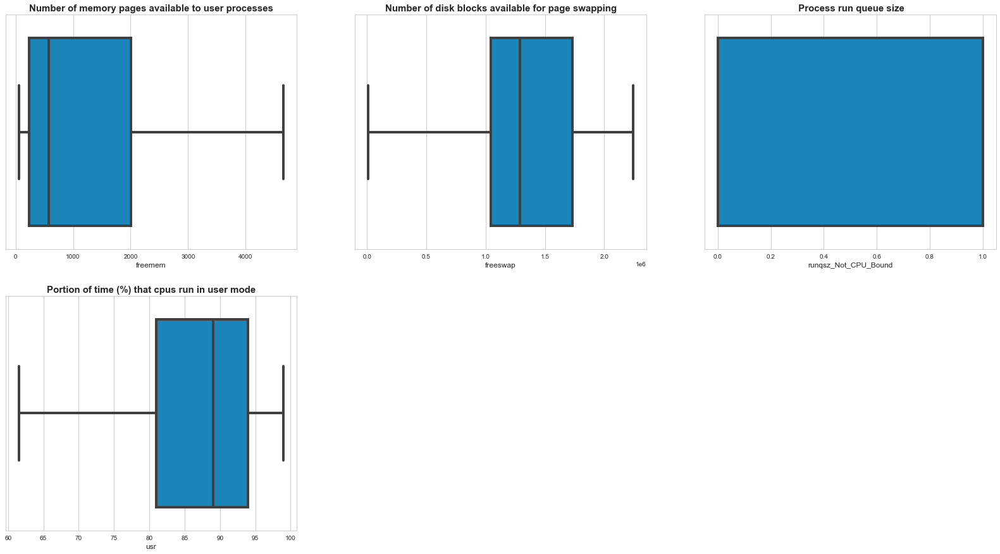

In [592]:
## Outlier check after treatment 3
plt.figure(figsize =(25,15));
plt.subplot(2,3,1); ## Row - Column - Order
plt.title("Number of memory pages available to user processes",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="freemem");

plt.subplot(2,3,2); ## Row - Column - Order
plt.title("Number of disk blocks available for page swapping",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="freeswap");

plt.subplot(2,3,3); ## Row - Column - Order
plt.title(" Process run queue size",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="runqsz_Not_CPU_Bound");

plt.subplot(2,3,4); ## Row - Column - Order
plt.title("Portion of time (%) that cpus run in user mode",fontsize=15, weight="bold")
sns.boxplot(data=compactiv_df,x="usr");

In [593]:
compactiv_df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.342285e+01,15.159741,0.0,2.00,7.0,20.000,4.700000e+01
lwrite,8192.0,6.657471e+00,9.291945,0.0,0.00,1.0,10.000,2.500000e+01
scall,8192.0,2.294484e+03,1593.093446,109.0,1012.00,2051.5,3317.250,6.775125e+03
sread,8192.0,1.997764e+02,146.758932,6.0,86.00,166.0,279.000,5.685000e+02
swrite,8192.0,1.379700e+02,97.141835,7.0,63.00,117.0,185.000,3.680000e+02
fork,8192.0,1.557771e+00,1.591220,0.0,0.40,0.8,2.200,4.900000e+00
exec,8192.0,1.931495e+00,2.028253,0.0,0.20,1.2,2.800,6.700000e+00
rchar,8192.0,1.788841e+05,174589.212910,278.0,34860.50,125473.5,265394.750,6.111961e+05
wchar,8192.0,7.564554e+04,71262.958027,1498.0,22977.75,46619.0,106037.000,2.306259e+05
pgout,8192.0,1.420901e+00,2.200251,0.0,0.00,0.0,2.400,6.000000e+00


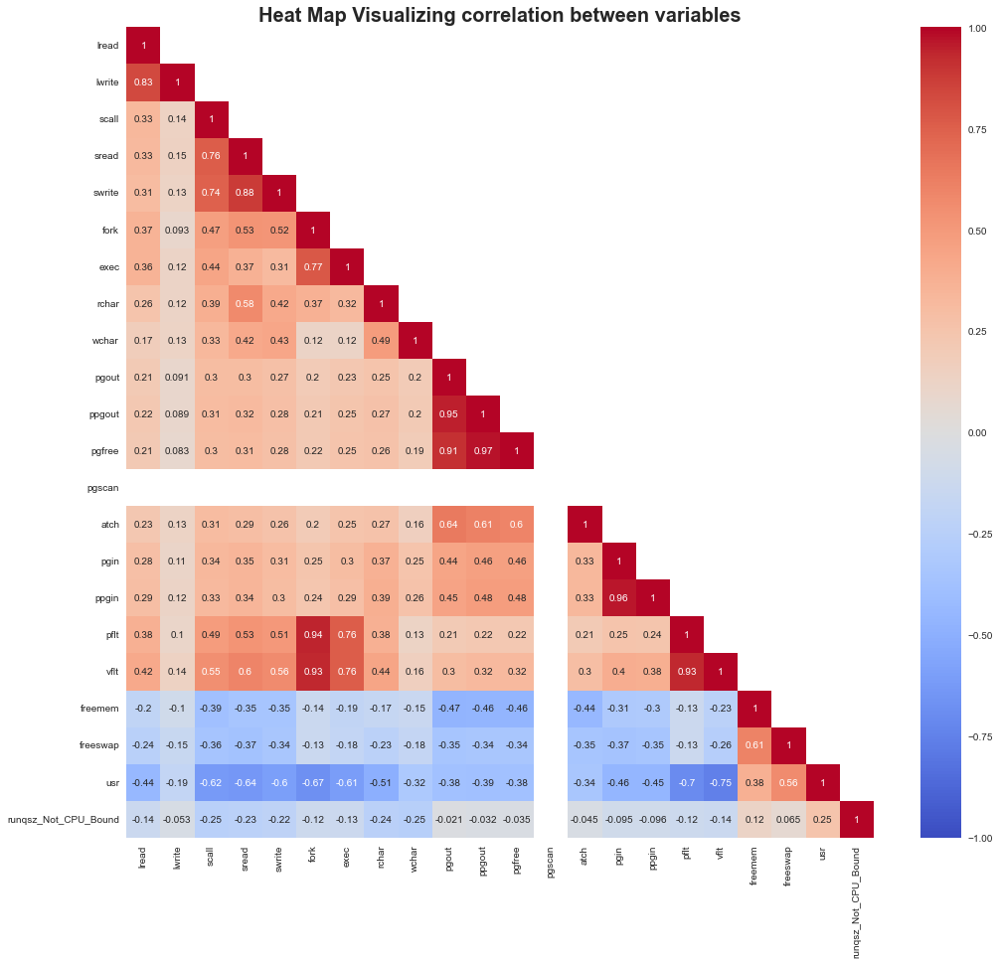

In [594]:
## Checking on the correlation between the variables
Cor = compactiv_df.corr(method='pearson')
plt.figure(figsize=(15 ,15))
plt.title("Heat Map Visualizing correlation between variables",fontsize=20, weight="bold")
mask = np.array(Cor)
mask[np.tril_indices_from(mask)] =False
sns.heatmap(data =Cor, annot =True, mask =mask,vmax =1, vmin=-1, cmap ='coolwarm');

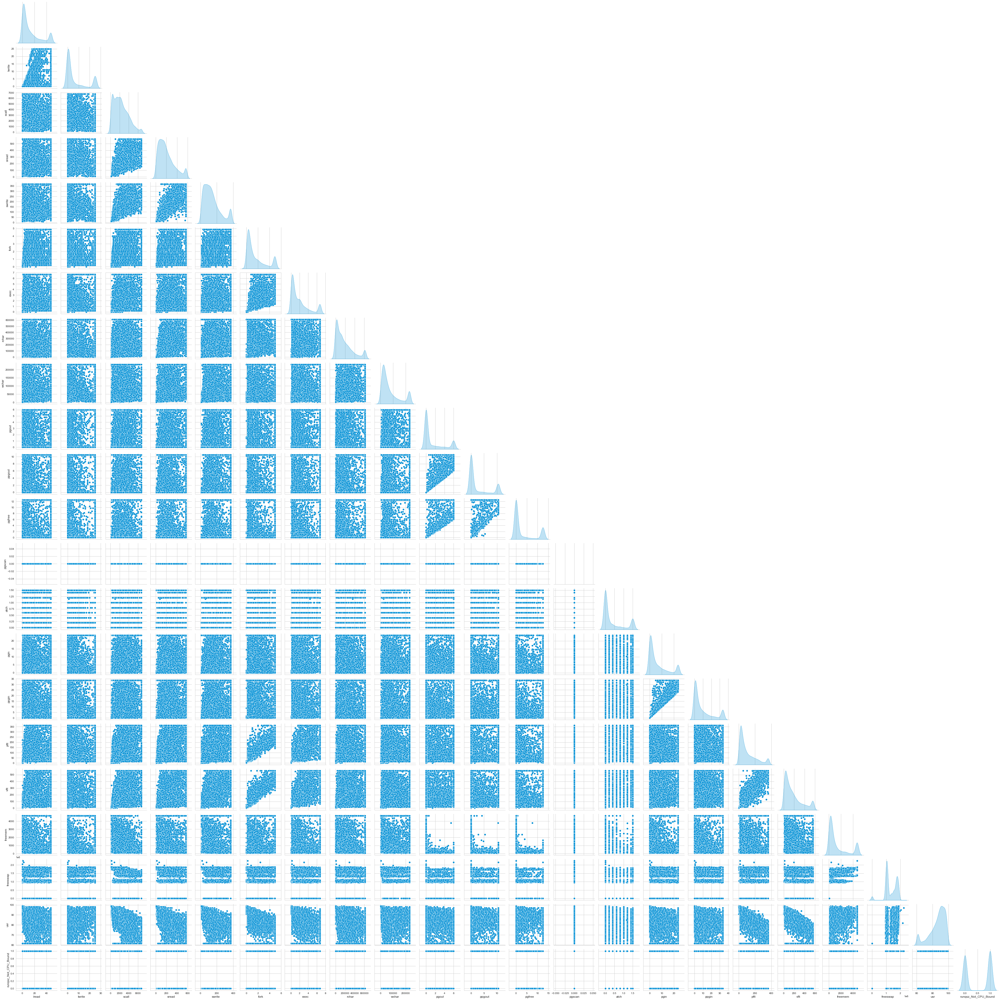

In [595]:
sns.pairplot(compactiv_df,diag_kind='kde',corner=True)

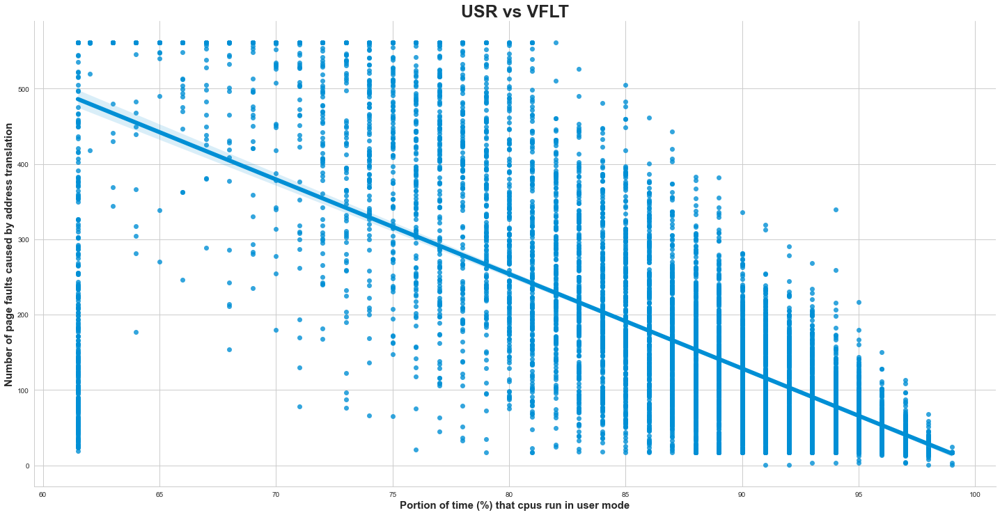

In [596]:
#Plotting relevant graph using seaborn
sns.lmplot(data= compactiv_df, x= "usr", y="vflt",height=10,aspect=2);
ax = plt.gca()
ax.set_title("USR vs VFLT",fontsize=25, weight="bold")

#Label the axes and rotate the label of the categories so that it is readable 
plt.xticks(rotation = 0)
plt.xlabel("Portion of time (%) that cpus run in user mode",fontsize=15, weight="bold");
plt.ylabel("Number of page faults caused by address translation",fontsize=15, weight="bold");

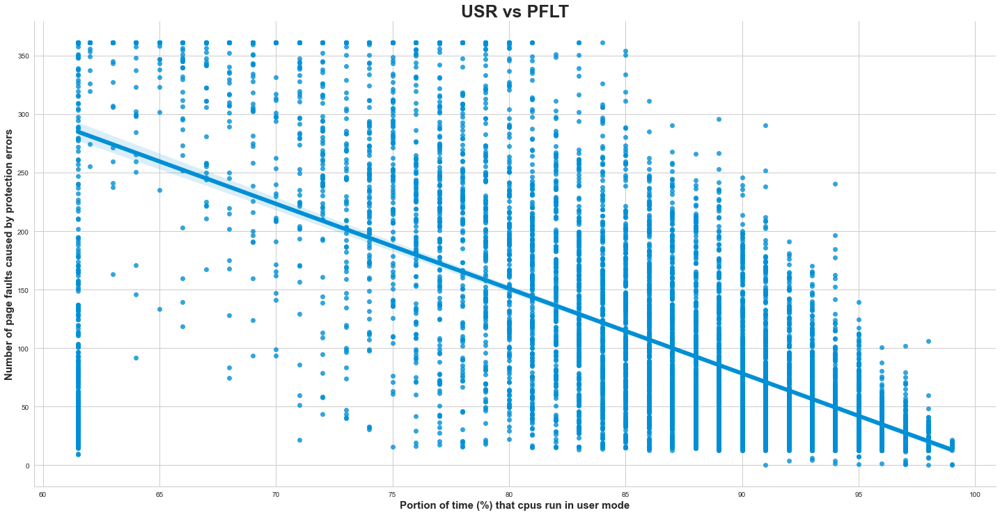

In [597]:
#Plotting relevant graph using seaborn
sns.lmplot(data= compactiv_df, x= "usr", y="pflt",height=10,aspect=2);
ax = plt.gca()
ax.set_title("USR vs PFLT",fontsize=25, weight="bold")

#Label the axes and rotate the label of the categories so that it is readable 
plt.xticks(rotation = 0)
plt.xlabel("Portion of time (%) that cpus run in user mode",fontsize=15, weight="bold");
plt.ylabel("Number of page faults caused by protection errors",fontsize=15, weight="bold");

### Checking for Multicollinearity -  VIF

In [598]:
vif = pd.DataFrame()
vif["Features"] = compactiv_df.columns
vif["VIF Score"] = [variance_inflation_factor(compactiv_df.values, i) for i in range(compactiv_df.shape[1])]
vif.sort_values(by = 'VIF Score', ascending = False)

,Features,VIF Score
10,ppgout,43.019212
17,vflt,32.816397
20,usr,28.164636
5,fork,25.336356
19,freeswap,25.115743
16,pflt,24.296776
11,pgfree,24.111997
15,ppgin,23.350190
14,pgin,23.215483
3,sread,18.600202


### Linear Regression Modelling - Scikit

In [599]:
## Now dataset is ready for linear regression.We seperate the dependent and independent variables
# Copy all the predictor variables into X dataframe
X = compactiv_df.drop('usr', axis=1)

# Copy target into the y dataframe. 
Y = compactiv_df[['usr']]

In [600]:
# Checking the Independent Variable -Inputs
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,1


In [601]:
# Checking the Dependent Variable -Output
Y.head()

,usr
0,95.0
1,97.0
2,87.0
3,98.0
4,90.0


In [602]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.30 , random_state=0)

In [603]:
print('Number of rows and columns of the training set for the independent variables:',X_train.shape)
print('Number of rows and columns of the training set for the dependent variable:',Y_train.shape)
print('Number of rows and columns of the test set for the independent variables:',X_test.shape)
print('Number of rows and columns of the test set for the dependent variable:',Y_test.shape)

Number of rows and columns of the training set for the independent variables: (5734, 21)
Number of rows and columns of the training set for the dependent variable: (5734, 1)
Number of rows and columns of the test set for the independent variables: (2458, 21)
Number of rows and columns of the test set for the dependent variable: (2458, 1)


In [604]:
# invoke the LinearRegression function and find the bestfit model on training data
## We fit regression model on training data         
## LinearRegression() -  We create an object, that is, we invoke the linear regression function

regression_model = LinearRegression()
regression_model.fit(X_train, Y_train)

LinearRegression()

In [605]:
#The Coefficients of the model from teh model is given as
model_coeff = pd.DataFrame()
model_coeff["Columns"] = X_train.columns
model_coeff['Coefficient Estimate'] = pd.Series(regression_model.coef_[0])

model_coeff.head(21)

,Columns,Coefficient Estimate
0,lread,-7.198099e-02
1,lwrite,6.303266e-02
2,scall,-6.894191e-04
3,sread,1.727363e-03
4,swrite,-5.471311e-03
5,fork,-1.064429e-01
6,exec,-2.830455e-01
7,rchar,-4.664703e-06
8,wchar,-6.306943e-06
9,pgout,-3.908755e-01


In [606]:
print(f"The Intercept/constant is {regression_model.intercept_[0]}")

The Intercept/constant is 83.58331495180977


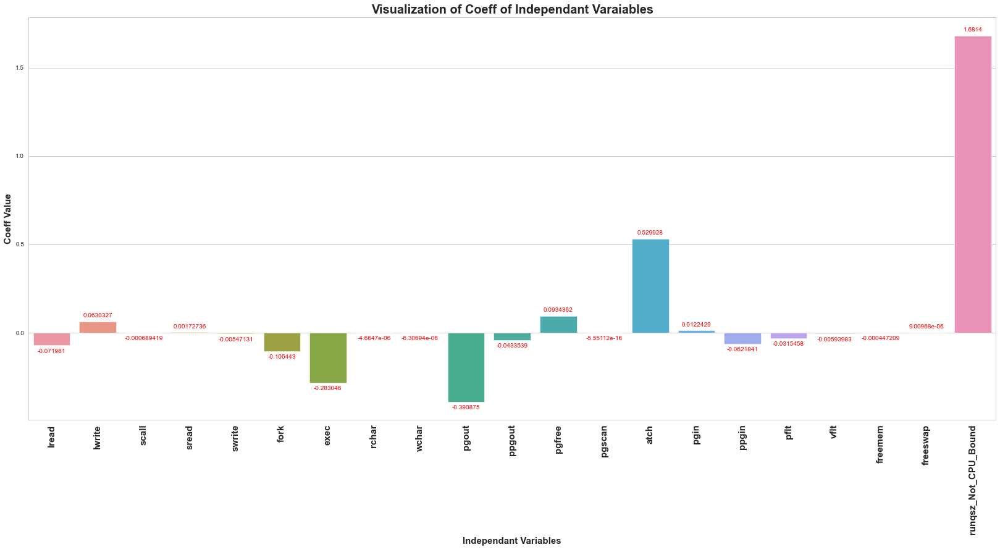

In [607]:
# Visualizing the coefficients
plt.figure(figsize =(25, 12))
plt.title("Visualization of Coeff of Independant Varaiables",fontsize=20, weight="bold")
ax=sns.barplot(x ='Columns', y = 'Coefficient Estimate', data = model_coeff)

#Label the axes and rotate the label of the categories so that it is readable 
plt.xticks(rotation = 90,fontsize=15, weight="bold")
plt.xlabel("Independant Variables",fontsize=15, weight="bold");
plt.ylabel("Coeff Value",fontsize=15, weight="bold");
ax.bar_label(ax.containers[0], label_type='edge', color = 'red',rotation =0, fontsize = 10,padding =5) #matplotlib version is above 3.4
plt.show()

In [608]:
# R square on training data
## The score here is the coefficient of determination
print(f"The R Square on the training data is {regression_model.score(X_train, Y_train)}")

The R Square on the training data is 0.7881295586063253


In [609]:
# R square on testing data
## The score here is the coefficient of determination
print(f"The R Square on the testing data is {regression_model.score(X_test, Y_test)}")

The R Square on the testing data is 0.7876152686510804


In [610]:
#RMSE on Training data
predicted_train = regression_model.fit(X_train, Y_train).predict(X_train)
print(f"The RMSE on the training data is {np.sqrt(metrics.mean_squared_error(Y_train,predicted_train))}")

The RMSE on the training data is 4.4872380018802405


In [611]:
#RMSE on testing data
predicted_test = regression_model.fit(X_test, Y_test).predict(X_test)
print(f"The RMSE on the testing data is {np.sqrt(metrics.mean_squared_error(Y_test,predicted_test))}")

The RMSE on the testing data is 4.453647198202485


### Linear Regression Modelling - Stats Model

In [612]:
# concatenate X and y into a single dataframe -  Adding dependent and independent variable
data_train = pd.concat([X_train, Y_train], axis=1)
data_test = pd.concat([X_test,Y_test],axis=1)
data_train.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound,usr
7252,5.0,3.0,1855.0,94.0,98.0,0.20,0.20,9122.0,27521.0,0.0,...,0.0,0.0,0.8000,1.00,16.00,28.60,2788.000,1532637.0,0,96.0
238,47.0,25.0,2680.0,373.0,289.0,3.19,2.99,276666.0,110753.0,6.0,...,0.0,0.0,8.3800,14.97,182.24,380.24,77.000,10989.5,0,61.5
1524,47.0,25.0,2023.0,193.0,101.0,0.20,0.20,130770.0,18136.0,0.0,...,0.0,0.0,1.0000,1.20,15.80,19.00,3438.000,1710080.0,0,91.0
4827,24.0,25.0,371.0,27.0,55.0,0.20,0.20,791.0,27404.0,0.0,...,0.0,0.0,0.0000,0.00,15.37,16.77,4659.125,1860192.0,1,97.0
2165,47.0,6.0,5040.0,103.0,93.0,1.80,6.70,29913.0,129926.0,6.0,...,0.0,1.5,23.5125,33.60,141.00,162.20,168.000,1518035.0,0,75.0


In [613]:
data_train.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound', 'usr'],
      dtype='object')

In [614]:
Expression = 'usr ~ lread + lwrite + scall + sread + swrite + fork + exec + rchar + wchar + pgout + ppgout + pgfree + pgscan + atch + pgin + ppgin + pflt + vflt + freemem + freeswap + runqsz_Not_CPU_Bound'

In [615]:
lm1 = smf.ols(formula= Expression, data = data_train).fit()
lm1.params

Intercept               8.358331e+01
lread                  -7.198099e-02
lwrite                  6.303266e-02
scall                  -6.894191e-04
sread                   1.727363e-03
swrite                 -5.471311e-03
fork                   -1.064429e-01
exec                   -2.830455e-01
rchar                  -4.664703e-06
wchar                  -6.306943e-06
pgout                  -3.908755e-01
ppgout                 -4.335392e-02
pgfree                  9.343621e-02
pgscan                 -6.137913e-15
atch                    5.299278e-01
pgin                    1.224288e-02
ppgin                  -6.218414e-02
pflt                   -3.154580e-02
vflt                   -5.939833e-03
freemem                -4.472088e-04
freeswap                9.009683e-06
runqsz_Not_CPU_Bound    1.681395e+00
dtype: float64

In [616]:
## Checking the summary of Regression through OLS
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.788
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     1063.
Date:                Sun, 13 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:39:09   Log-Likelihood:                -16744.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5713   BIC:                         3.367e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               83.5833 

In [617]:
# Calculate MSE
mse = np.mean((lm1.predict(data_train.drop('usr',axis=1))-data_train['usr'])**2)
print(f"The RMSE on the training data is {np.sqrt(mse)}")

The RMSE on the training data is 4.487238001880238


In [618]:
vif = pd.DataFrame()
vif["Features"] = data_train.columns
vif["VIF Score"] = [variance_inflation_factor(data_train.values, i) for i in range(data_train.shape[1])]
vif.sort_values(by = 'VIF Score', ascending = False)

,Features,VIF Score
10,ppgout,46.419031
17,vflt,33.696324
21,usr,28.219245
11,pgfree,25.874509
5,fork,25.667137
19,freeswap,25.198223
16,pflt,24.286276
15,ppgin,23.117451
14,pgin,22.953842
3,sread,18.697320


In [619]:
data_train.drop("pgin",axis=1,inplace=True)
data_train.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound', 'usr'],
      dtype='object')

In [620]:
#We delete pgin ad run the model again
Expression = 'usr ~ lread + lwrite + scall + sread + swrite + fork + exec + rchar + wchar + pgout + ppgout + pgfree + pgscan + atch + ppgin + pflt + vflt + freemem + freeswap + runqsz_Not_CPU_Bound'

In [621]:
lm1 = smf.ols(formula= Expression, data = data_train).fit()
lm1.params

Intercept               8.359318e+01
lread                  -7.211975e-02
lwrite                  6.310107e-02
scall                  -6.884224e-04
sread                   1.723067e-03
swrite                 -5.474604e-03
fork                   -1.079036e-01
exec                   -2.825363e-01
rchar                  -4.678137e-06
wchar                  -6.299851e-06
pgout                  -3.887715e-01
ppgout                 -4.434248e-02
pgfree                  9.303826e-02
pgscan                  1.159944e-14
atch                    5.301928e-01
ppgin                  -5.423029e-02
pflt                   -3.159397e-02
vflt                   -5.873964e-03
freemem                -4.474321e-04
freeswap                9.004636e-06
runqsz_Not_CPU_Bound    1.681936e+00
dtype: float64

In [622]:
## Checking the summary of Regression through OLS
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.788
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     1119.
Date:                Sun, 13 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:39:09   Log-Likelihood:                -16744.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5714   BIC:                         3.366e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               83.5932 

In [623]:
vif = pd.DataFrame()
vif["Features"] = data_train.columns
vif["VIF Score"] = [variance_inflation_factor(data_train.values, i) for i in range(data_train.shape[1])]
vif.sort_values(by = 'VIF Score', ascending = False)

,Features,VIF Score
10,ppgout,46.384505
16,vflt,33.294298
20,usr,28.072702
11,pgfree,25.865891
5,fork,25.650025
18,freeswap,25.096071
15,pflt,24.218409
3,sread,18.695445
4,swrite,17.012741
9,pgout,16.925418


In [624]:
data_train.drop("ppgout",axis=1,inplace=True)
data_train.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'pgfree', 'pgscan', 'atch', 'ppgin', 'pflt', 'vflt',
       'freemem', 'freeswap', 'runqsz_Not_CPU_Bound', 'usr'],
      dtype='object')

In [625]:
#We delete ppgout ad run the model again
Expression = 'usr ~ lread + lwrite + scall + sread + swrite + fork + exec + rchar + wchar + pgout + pgfree + pgscan + atch + ppgin + pflt + vflt + freemem + freeswap + runqsz_Not_CPU_Bound'

In [626]:
lm1 = smf.ols(formula= Expression, data = data_train).fit()
lm1.params

Intercept               8.360603e+01
lread                  -7.224281e-02
lwrite                  6.323527e-02
scall                  -6.884159e-04
sread                   1.719239e-03
swrite                 -5.477245e-03
fork                   -1.063699e-01
exec                   -2.828943e-01
rchar                  -4.682438e-06
wchar                  -6.326535e-06
pgout                  -4.215172e-01
pgfree                  7.128918e-02
pgscan                  3.768184e-14
atch                    5.332369e-01
ppgin                  -5.439411e-02
pflt                   -3.160213e-02
vflt                   -5.877532e-03
freemem                -4.483317e-04
freeswap                9.001311e-06
runqsz_Not_CPU_Bound    1.680747e+00
dtype: float64

In [627]:
## Checking the summary of Regression through OLS
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.788
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     1181.
Date:                Sun, 13 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:39:09   Log-Likelihood:                -16745.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5715   BIC:                         3.365e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               83.6060 

In [628]:
vif = pd.DataFrame()
vif["Features"] = data_train.columns
vif["VIF Score"] = [variance_inflation_factor(data_train.values, i) for i in range(data_train.shape[1])]
vif.sort_values(by = 'VIF Score', ascending = False)

,Features,VIF Score
15,vflt,33.293980
19,usr,27.903054
5,fork,25.637894
17,freeswap,25.057696
14,pflt,24.218064
3,sread,18.694408
4,swrite,17.012666
9,pgout,9.319747
2,scall,9.249795
0,lread,8.938184


In [629]:
data_train.drop("fork",axis=1,inplace=True)
data_train.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'pgfree', 'pgscan', 'atch', 'ppgin', 'pflt', 'vflt', 'freemem',
       'freeswap', 'runqsz_Not_CPU_Bound', 'usr'],
      dtype='object')

In [630]:
#We delete fork ad run the model again
Expression = 'usr ~ lread + lwrite + scall + sread + swrite + exec + rchar + wchar + pgout + pgfree + pgscan + atch + ppgin + pflt + vflt + freemem + freeswap + runqsz_Not_CPU_Bound'

In [631]:
lm1 = smf.ols(formula= Expression, data = data_train).fit()
lm1.params

Intercept               8.363760e+01
lread                  -7.251093e-02
lwrite                  6.389751e-02
scall                  -6.819783e-04
sread                   1.776358e-03
swrite                 -5.711295e-03
exec                   -2.949670e-01
rchar                  -4.687963e-06
wchar                  -6.306958e-06
pgout                  -4.217853e-01
pgfree                  7.169190e-02
pgscan                  3.031948e-14
atch                    5.417876e-01
ppgin                  -5.341568e-02
pflt                   -3.217429e-02
vflt                   -6.432342e-03
freemem                -4.481952e-04
freeswap                8.983032e-06
runqsz_Not_CPU_Bound    1.679312e+00
dtype: float64

In [632]:
## Checking the summary of Regression through OLS
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.788
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     1250.
Date:                Sun, 13 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:39:09   Log-Likelihood:                -16745.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5716   BIC:                         3.365e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               83.6376 

In [633]:
vif = pd.DataFrame()
vif["Features"] = data_train.columns
vif["VIF Score"] = [variance_inflation_factor(data_train.values, i) for i in range(data_train.shape[1])]
vif.sort_values(by = 'VIF Score', ascending = False)

,Features,VIF Score
18,usr,27.466492
14,vflt,25.369545
16,freeswap,24.679853
13,pflt,21.143256
3,sread,18.604983
4,swrite,16.318300
8,pgout,9.319713
2,scall,9.090252
0,lread,8.927612
9,pgfree,8.912496


In [634]:
data_train.drop("sread",axis=1,inplace=True)
data_train.columns

Index(['lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'pgscan', 'atch', 'ppgin', 'pflt', 'vflt', 'freemem',
       'freeswap', 'runqsz_Not_CPU_Bound', 'usr'],
      dtype='object')

In [635]:
#We delete sread and run the model again
Expression = 'usr ~ lread + lwrite + scall + swrite + exec + rchar + wchar + pgout + pgfree + pgscan + atch + ppgin + pflt + vflt + freemem + freeswap + runqsz_Not_CPU_Bound'

In [636]:
lm1 = smf.ols(formula= Expression, data = data_train).fit()
lm1.params

Intercept               8.366294e+01
lread                  -7.332106e-02
lwrite                  6.523667e-02
scall                  -6.461517e-04
swrite                 -4.114926e-03
exec                   -3.001651e-01
rchar                  -4.324229e-06
wchar                  -6.472462e-06
pgout                  -4.242913e-01
pgfree                  7.425970e-02
pgscan                  8.764727e-14
atch                    5.326521e-01
ppgin                  -5.407726e-02
pflt                   -3.218406e-02
vflt                   -6.288155e-03
freemem                -4.470144e-04
freeswap                8.957616e-06
runqsz_Not_CPU_Bound    1.678778e+00
dtype: float64

In [637]:
## Checking the summary of Regression through OLS
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.788
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     1328.
Date:                Sun, 13 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:39:10   Log-Likelihood:                -16746.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5717   BIC:                         3.364e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               83.6629 

In [638]:
vif = pd.DataFrame()
vif["Features"] = data_train.columns
vif["VIF Score"] = [variance_inflation_factor(data_train.values, i) for i in range(data_train.shape[1])]
vif.sort_values(by = 'VIF Score', ascending = False)

,Features,VIF Score
17,usr,27.392986
13,vflt,25.252320
15,freeswap,24.523281
12,pflt,21.143251
7,pgout,9.316051
3,swrite,9.303795
0,lread,8.903767
8,pgfree,8.891434
2,scall,8.125213
1,lwrite,6.101878


In [639]:
# Calculate MSE
mse = np.mean((lm1.predict(data_train.drop('usr',axis=1))- data_train['usr'])**2)
print(f"The RMSE on the training data is {np.sqrt(mse)}")

The RMSE on the training data is 4.488821706414649


In [640]:
# Prediction on Test data
y_pred = lm1.predict(data_test)

### Cross Checking

In [641]:
# Creating the dataframe for the necessary columns
df_pred = pd.DataFrame()
df_pred["Actual data"] = Y_train['usr']
df_pred["Predicted Values"] = lm1.fittedvalues.values
df_pred["Residuals"] = lm1.resid.values
df_pred.head()

,Actual data,Predicted Values,Residuals
7252,96.0,93.346199,2.653801
238,61.5,65.496914,-3.996914
1524,91.0,92.470628,-1.470628
4827,97.0,98.486132,-1.486132
2165,75.0,79.317048,-4.317048


Text(0, 0.5, 'Residuals')

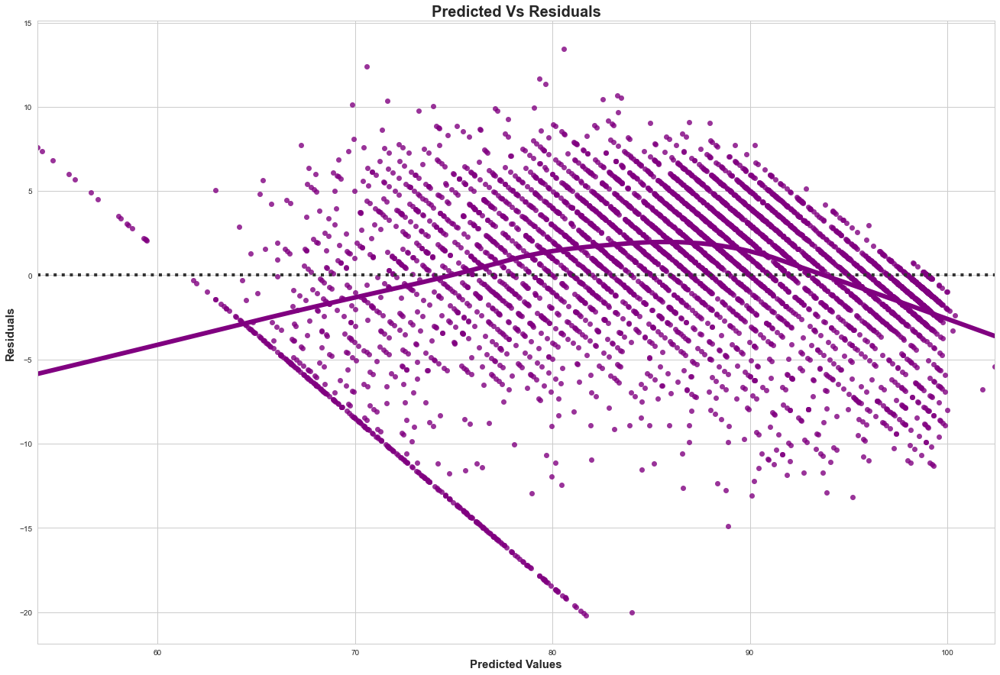

In [642]:
# Residual Plots -  Checking pattern in residual
plt.figure(figsize=(20,15))
sns.residplot(data = df_pred, x = "Predicted Values", y = 'Residuals', color ='purple', lowess=True)
# lowess  -stands for locally weighted scatterplot smoothing. It is a non-parametric technique.
# Lowess reveal trends and cycles in data that might be difficult to model with a parametric curve

plt.title("Predicted Vs Residuals",fontsize=20, weight="bold")
plt.xlabel ("Predicted Values",fontsize=15, weight="bold")
plt.ylabel ("Residuals",fontsize=15, weight="bold")

Skew : -1.1199318140618415


Text(0, 0.5, 'Count')

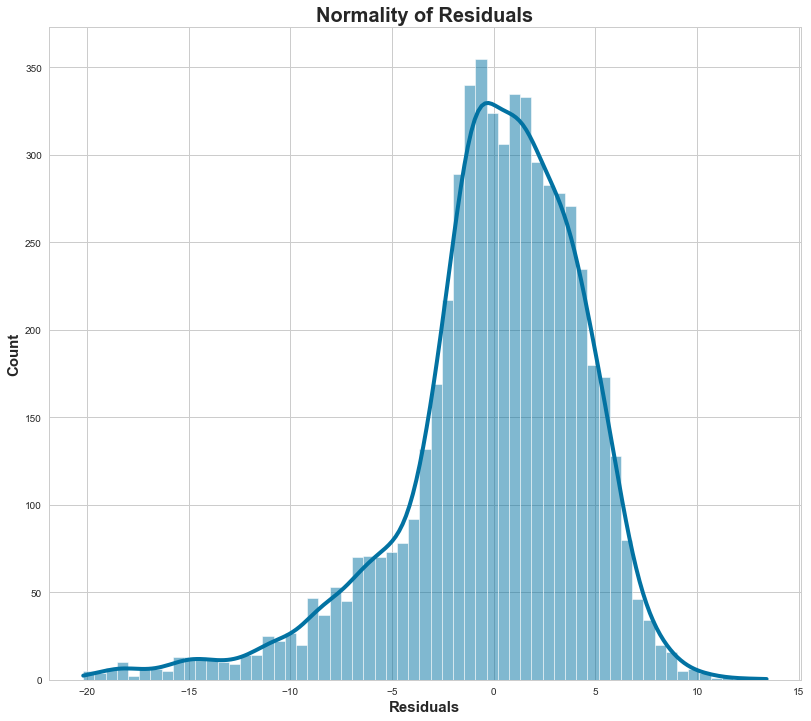

In [643]:
# Test for Normality
plt.figure(figsize=(12,12))
sns.histplot(df_pred["Residuals"], kde =True)

print("Skew :",df_pred["Residuals"].skew())

plt.title("Normality of Residuals",fontsize=20, weight="bold")
plt.xlabel ("Residuals",fontsize=15, weight="bold")
plt.ylabel ("Count",fontsize=15, weight="bold")

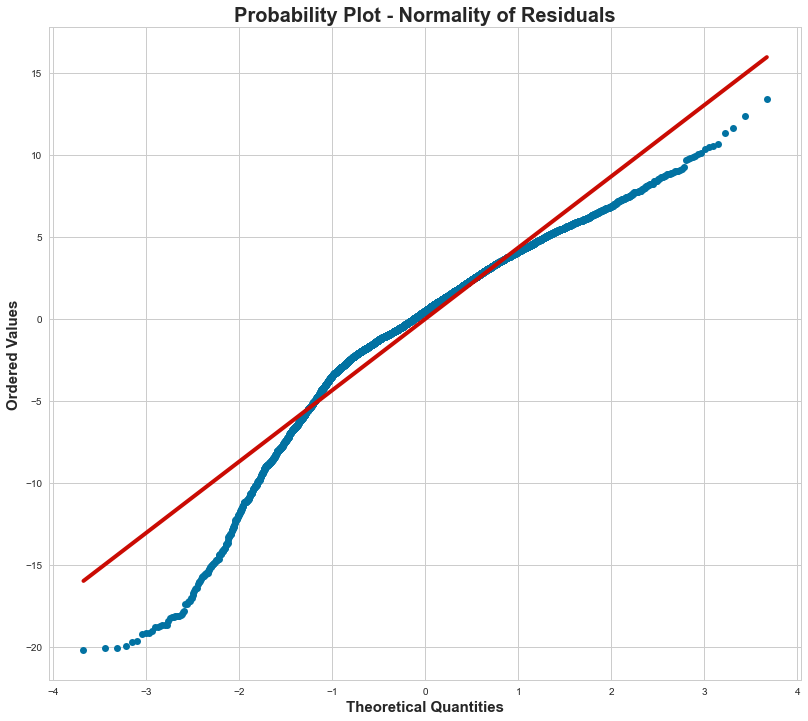

In [644]:
import pylab

plt.figure(figsize=(12,12))
stats.probplot(df_pred["Residuals"],dist ="norm", plot =pylab)

plt.title("Probability Plot - Normality of Residuals",fontsize=20, weight="bold")
plt.ylabel ("Ordered Values",fontsize=15, weight="bold")
plt.xlabel ("Theoretical Quantities",fontsize=15, weight="bold")
plt.show()

In [645]:
# Statistical Test
# Null Hypothesis  - Data is normally distributed
# Alternate Hypothesis - Data is NOT normally distributed
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9381015300750732, pvalue=1.0089348943138683e-43)

In [646]:
# Goldfeld-Quandt test
name = ["F Statistic", "p-value"]
test = sms.het_goldfeldquandt(lm1.resid,lm1.model.exog)
lzip(name, test)

[('F Statistic', 1.0329862654843336), ('p-value', 0.19319382929860213)]

### Visualizing the Linear Regression plots

Text(0, 0.5, 'Predicted')

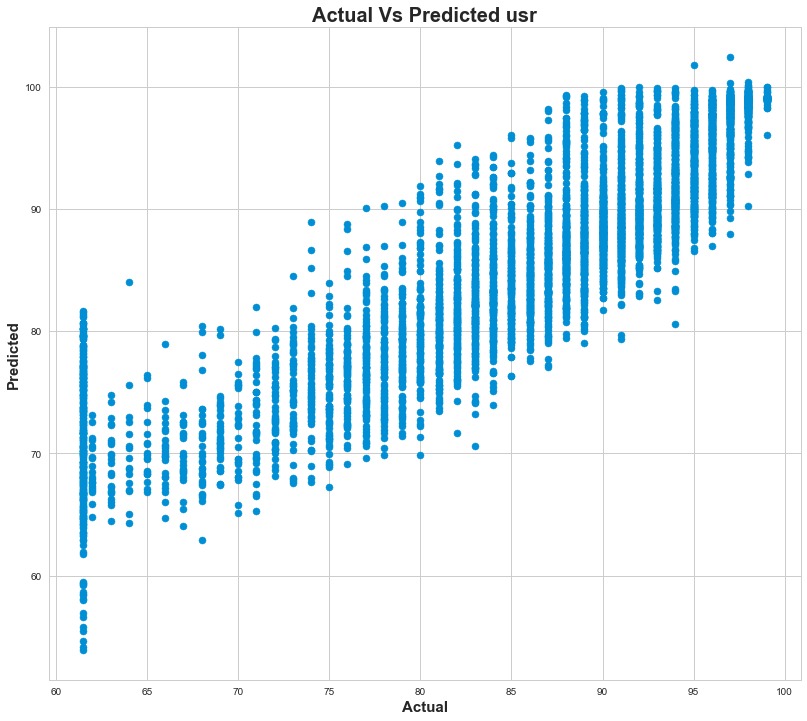

In [647]:
plt.figure(figsize=(12,12))
plt.scatter(df_pred["Actual data"], df_pred["Predicted Values"])
plt.title("Actual Vs Predicted usr",fontsize=20, weight="bold")
plt.xlabel("Actual",fontsize=15, weight="bold")
plt.ylabel("Predicted",fontsize=15, weight="bold")

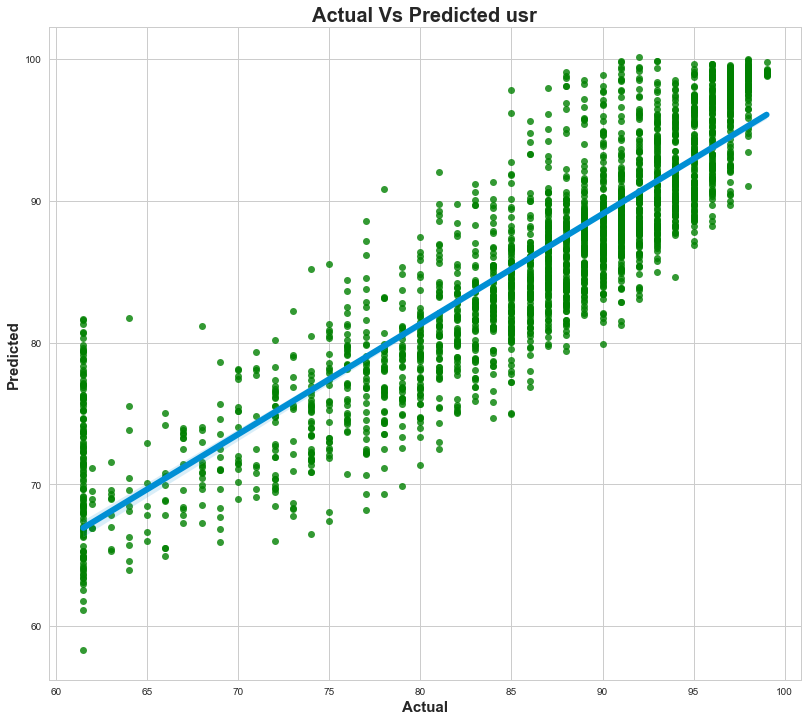

In [648]:
#option 2
plt.figure(figsize=(12,12))
sns.regplot(x = Y_test, y = y_pred,scatter_kws={"color": "green"});

plt.title("Actual Vs Predicted usr",fontsize=20, weight="bold")
plt.xlabel("Actual",fontsize=15, weight="bold")
plt.ylabel("Predicted",fontsize=15, weight="bold")
plt.show()

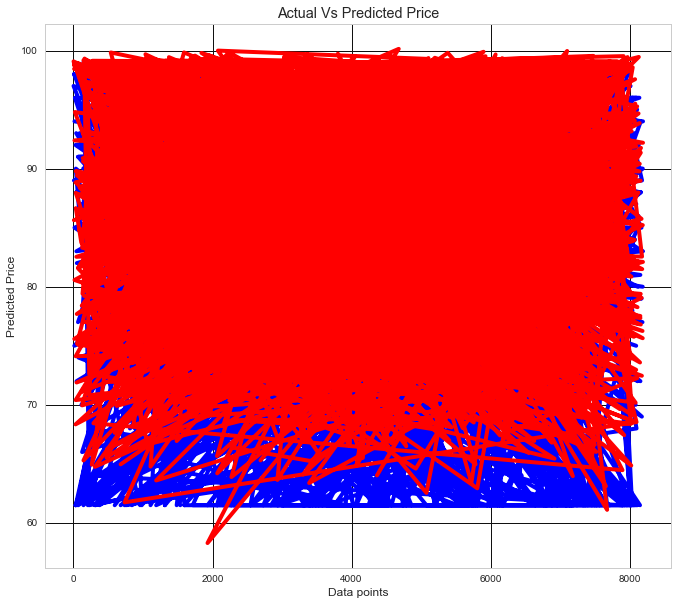

In [649]:
#  option 3

plt.figure(figsize=(10,10))
plt.plot(Y_test['usr'],"blue")
plt.plot(y_pred,"red")


plt.title("Actual Vs Predicted Price")
plt.xlabel ("Data points")
plt.ylabel ("Predicted Price");
plt.grid(True, color ="k")
plt.style.use("fivethirtyeight")

### Regression Equation

In [650]:
for i,j in np.array(lm1.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(83.66) * Intercept + (-0.07) * lread + (0.07) * lwrite + (-0.0) * scall + (-0.0) * swrite + (-0.3) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.42) * pgout + (0.07) * pgfree + (0.0) * pgscan + (0.53) * atch + (-0.05) * ppgin + (-0.03) * pflt + (-0.01) * vflt + (-0.0) * freemem + (0.0) * freeswap + (1.68) * runqsz_Not_CPU_Bound + 

In [651]:
model_coeff_stat = pd.DataFrame()
model_coeff_stat.index = lm1.params.index
model_coeff_stat['Coefficient Estimate'] = lm1.params

model_coeff_stat.head(21)

,Coefficient Estimate
Intercept,8.366294e+01
lread,-7.332106e-02
lwrite,6.523667e-02
scall,-6.461517e-04
swrite,-4.114926e-03
exec,-3.001651e-01
rchar,-4.324229e-06
wchar,-6.472462e-06
pgout,-4.242913e-01
pgfree,7.425970e-02


In [652]:
model_coeff_stat.drop(index="Intercept",inplace=True)

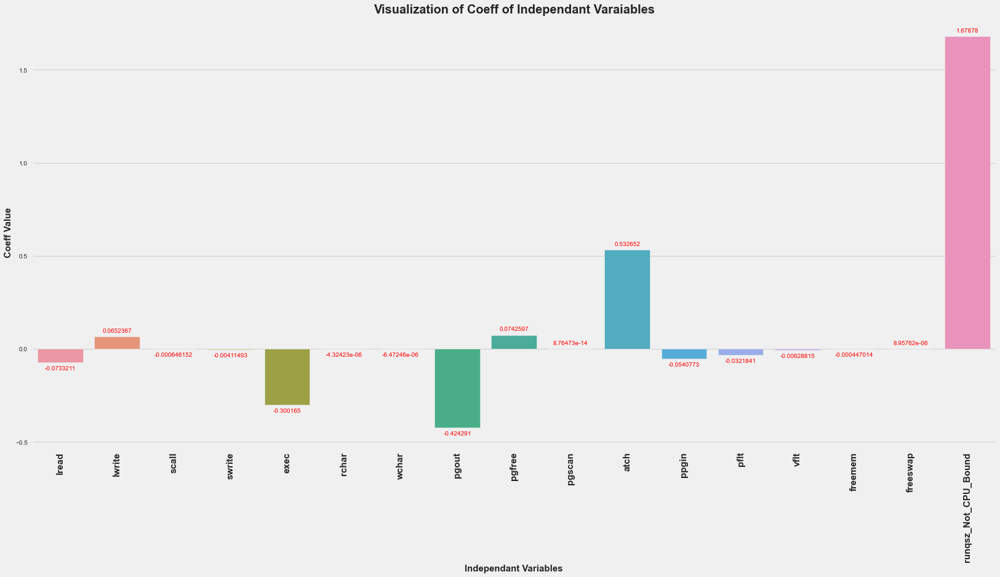

In [653]:
# Visualizing the coefficients
plt.figure(figsize =(25, 12))
plt.title("Visualization of Coeff of Independant Varaiables",fontsize=20, weight="bold")
ax=sns.barplot(x = model_coeff_stat.index, y = 'Coefficient Estimate', data = model_coeff_stat)

#Label the axes and rotate the label of the categories so that it is readable 
plt.xticks(rotation = 90,fontsize=15, weight="bold")
plt.xlabel("Independant Variables",fontsize=15, weight="bold");
plt.ylabel("Coeff Value",fontsize=15, weight="bold");
ax.bar_label(ax.containers[0], label_type='edge', color = 'red',rotation =0, fontsize = 10,padding =5)
plt.show()

## Logistic Regression, LDA and CART

In [654]:
cmethod_df = pd.read_excel("D:\Visual Studio Projects\Python\Great Learning Data Science\Datasets\Contraceptive_method_dataset.xlsx")
cmethod_df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


### Data Dictionary

**Wife_age** - Wife's age (numerical)

**Wife_ education** - Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary

**Husband_education** - Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary

**No_of_children_born** - Number of children ever born (numerical)

**Wife_religion** - Wife's religion (binary) Non-Scientology, Scientology

**Wife_Working** - Wife's now working? (binary) Yes, No

**Husband_Occupation** - Husband's occupation (categorical) 1, 2, 3, 4(random)

**Standard_of_living_index** - Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high

**Media_exposure** - Media exposure (binary) Good, Not good

**Contraceptive_method_used** - Contraceptive method used (class attribute) No,Yes

### Exploratory Data Analysis (EDA)

In [655]:
#The size of the dataset is:
print(f"No. of Rows: {cmethod_df.shape[0]}")
print(f"No. of Columns: {cmethod_df.shape[1]}")

No. of Rows: 1473
No. of Columns: 10


In [656]:
cmethod_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [657]:
cmethod_df.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [658]:
cmethod_df["Wife_age"].median()

32.0

In [659]:
cmethod_df["No_of_children_born"].mode()[0]

2.0

In [660]:
cmethod_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,NaN,NaN,NaN,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1452.0,NaN,NaN,NaN,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [661]:
for feature in cmethod_df.columns: 
    if cmethod_df[feature].dtype == 'object': 
        print(feature)
        print(cmethod_df[feature].value_counts())
        print('\n')

Wife_ education
Tertiary      577
Secondary     410
Primary       334
Uneducated    152
Name: Wife_ education, dtype: int64


Husband_education
Tertiary      899
Secondary     352
Primary       178
Uneducated     44
Name: Husband_education, dtype: int64


Wife_religion
Scientology        1253
Non-Scientology     220
Name: Wife_religion, dtype: int64


Wife_Working
No     1104
Yes     369
Name: Wife_Working, dtype: int64


Standard_of_living_index
Very High    684
High         431
Low          229
Very Low     129
Name: Standard_of_living_index, dtype: int64


Media_exposure 
Exposed        1364
Not-Exposed     109
Name: Media_exposure , dtype: int64


Contraceptive_method_used
Yes    844
No     629
Name: Contraceptive_method_used, dtype: int64




In [662]:
cmethod_df.isin([0]).sum()

Wife_age                      0
Wife_ education               0
Husband_education             0
No_of_children_born          97
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [663]:
cmethod_df.duplicated().value_counts()

False    1393
True       80
dtype: int64

In [664]:
duplicate_df = cmethod_df[cmethod_df.duplicated()]
duplicate_df.head(30)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
79,38.0,Tertiary,Tertiary,1.0,Scientology,Yes,1,Very High,Exposed,No
167,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
224,47.0,Tertiary,Tertiary,4.0,Scientology,No,1,Very High,Exposed,No
270,30.0,Tertiary,Tertiary,2.0,Scientology,No,1,Very High,Exposed,No
299,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
394,29.0,Tertiary,Tertiary,0.0,Scientology,Yes,2,Very High,Exposed,No
414,20.0,Primary,Secondary,3.0,Scientology,No,3,Very High,Exposed,No
462,36.0,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes
492,37.0,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes
528,29.0,Tertiary,Tertiary,2.0,Scientology,Yes,1,High,Exposed,Yes


<span style='color:red'> THEY ARE NOT DUPLICATED! All values seem to be unique. </span>

In [665]:
cmethod_df.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

In [666]:
cmethod_df["Wife_age"] = np.where(np.isnan(cmethod_df["Wife_age"]),cmethod_df["Wife_age"].median(),cmethod_df["Wife_age"])
cmethod_df["No_of_children_born"] = np.where(np.isnan(cmethod_df["No_of_children_born"]),cmethod_df["No_of_children_born"].mode()[0],cmethod_df["No_of_children_born"])

cmethod_df.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [667]:
cmethod_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [668]:
cmethod_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1473.0,NaN,NaN,NaN,32.577054,8.073941,16.0,26.0,32.0,38.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1473.0,NaN,NaN,NaN,3.236253,2.352985,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


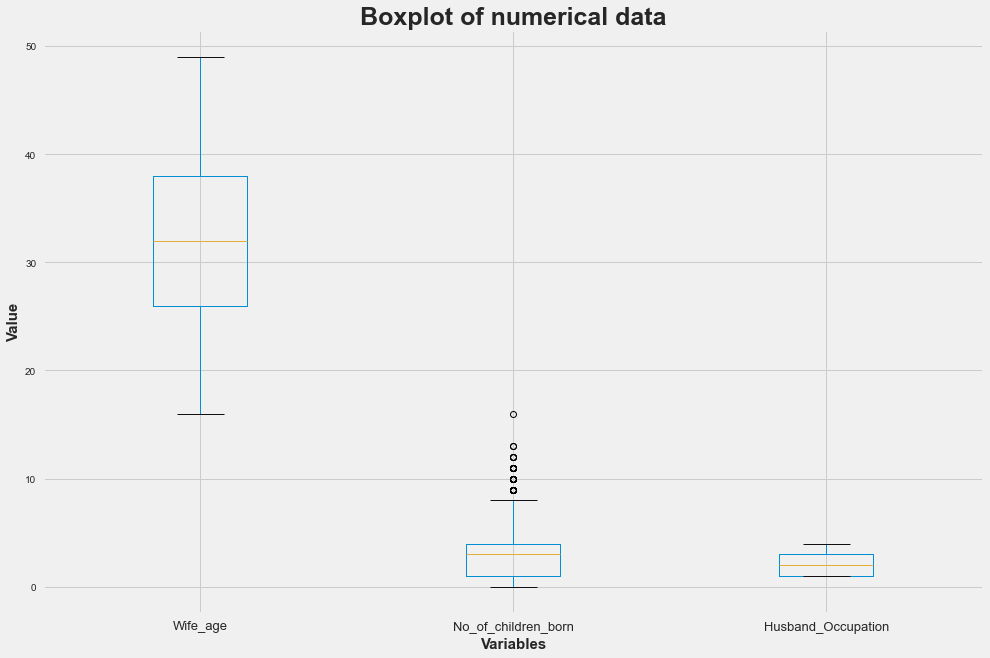

In [669]:
cmethod_df.boxplot(figsize=(15,10))
plt.style.use('seaborn-whitegrid')
plt.title("Boxplot of numerical data",fontsize=25, weight="bold")
plt.xlabel("Variables",fontsize=15, weight="bold")
plt.ylabel("Value",fontsize=15, weight="bold")
plt.xticks(rotation=0,fontsize=13)
plt.show()

In [670]:
Lr, Ur = outlier_treatment(cmethod_df["No_of_children_born"])

cmethod_df['No_of_children_born']=np.where(cmethod_df['No_of_children_born']>Ur,Ur,cmethod_df['No_of_children_born'])
cmethod_df['No_of_children_born']=np.where(cmethod_df['No_of_children_born']<Lr,Lr,cmethod_df['No_of_children_born'])

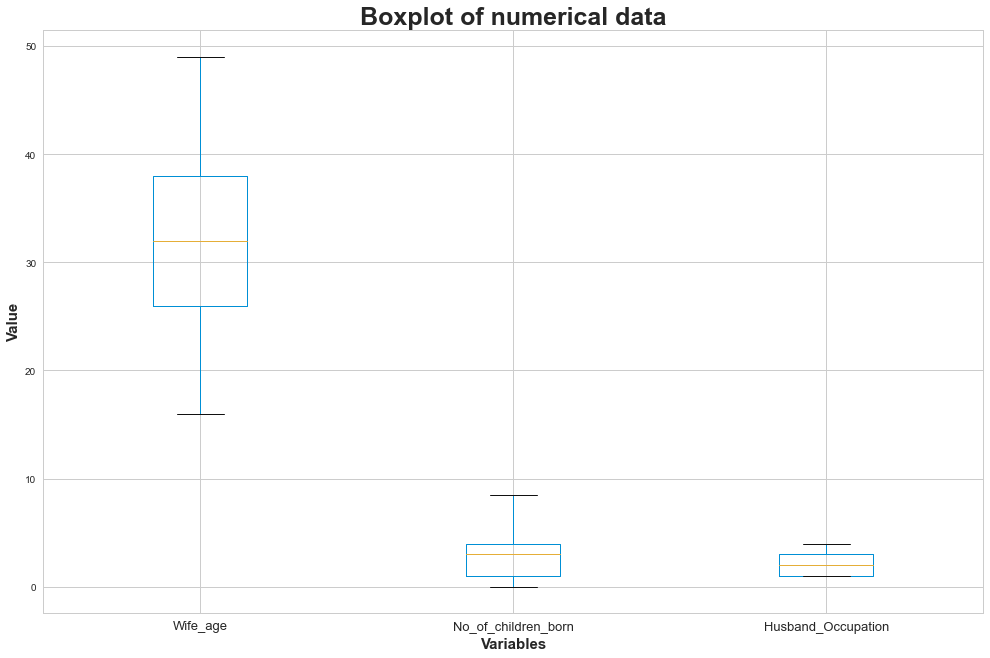

In [671]:
cmethod_df.boxplot(figsize=(15,10))
plt.title("Boxplot of numerical data",fontsize=25, weight="bold")
plt.xlabel("Variables",fontsize=15, weight="bold")
plt.ylabel("Value",fontsize=15, weight="bold")
plt.xticks(rotation=0,fontsize=13)
plt.show()

Text(0.5, 1, 'Multivariate response of numerical variables wrt Dependant variable')

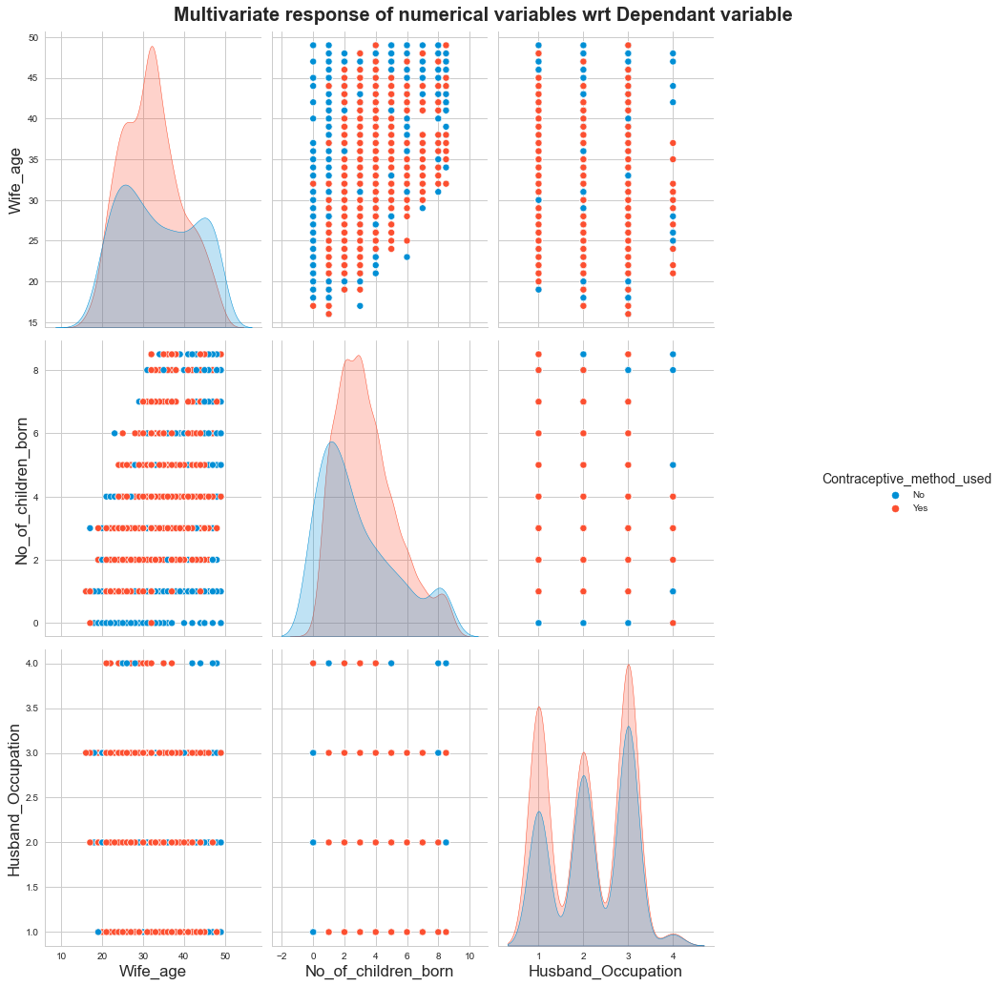

In [672]:
Pair_plt = sns.pairplot(cmethod_df,diag_kind="kde",hue="Contraceptive_method_used")
sns.set_style("whitegrid")
Pair_plt.fig.set_size_inches(15,15)
Pair_plt.fig.suptitle("Multivariate response of numerical variables wrt Dependant variable",fontsize=20,weight="bold", y=1)

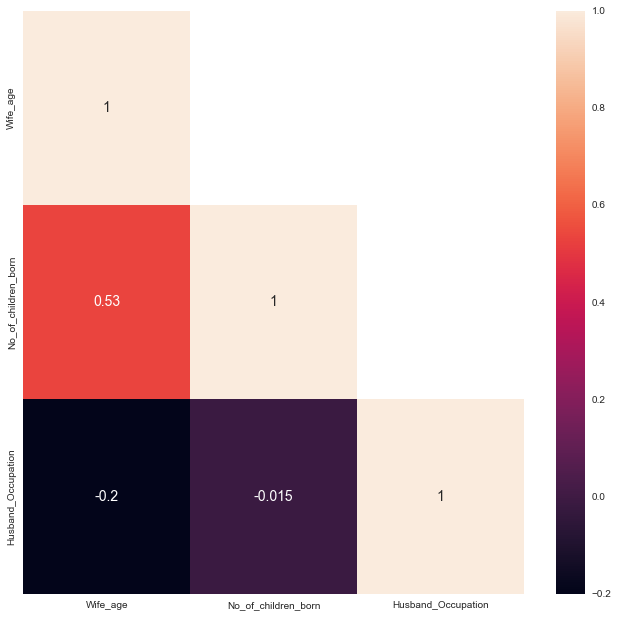

In [673]:
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
sns.heatmap(cmethod_df.corr(), annot=True,mask=np.triu(cmethod_df.corr(),+1));

In [674]:
cmethod_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1473.0,NaN,NaN,NaN,32.577054,8.073941,16.0,26.0,32.0,38.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1473.0,NaN,NaN,NaN,3.180244,2.185892,0.0,1.0,3.0,4.0,8.5
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [675]:
## Defining a Label Encoder object instance
LE = LabelEncoder()

In [676]:
## Applying the created Label Encoder object for the target class
#No = 0 and Yes = 1 
cmethod_df['Contraceptive_method_used'] = LE.fit_transform(cmethod_df['Contraceptive_method_used'])
cmethod_df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,0
1,45.0,Uneducated,Secondary,8.5,Scientology,No,3,Very High,Exposed,0
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,0
3,42.0,Secondary,Primary,8.5,Scientology,No,3,High,Exposed,0
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,0


In [677]:
## Converting the categorical variables to dummy variables for regression

cmethod_data_dummy = pd.get_dummies(cmethod_df,drop_first=True)
cmethod_data_dummy.head()

,Wife_age,No_of_children_born,Husband_Occupation,Contraceptive_method_used,Wife_ education_Secondary,Wife_ education_Tertiary,Wife_ education_Uneducated,Husband_education_Secondary,Husband_education_Tertiary,Husband_education_Uneducated,Wife_religion_Scientology,Wife_Working_Yes,Standard_of_living_index_Low,Standard_of_living_index_Very High,Standard_of_living_index_Very Low,Media_exposure _Not-Exposed
0,24.0,3.0,2,0,0,0,0,1,0,0,1,0,0,0,0,0
1,45.0,8.5,3,0,0,0,1,1,0,0,1,0,0,1,0,0
2,43.0,7.0,3,0,0,0,0,1,0,0,1,0,0,1,0,0
3,42.0,8.5,3,0,1,0,0,0,0,0,1,0,0,0,0,0
4,36.0,8.0,3,0,1,0,0,1,0,0,1,0,1,0,0,0


In [678]:
# Copy all the predictor variables into X dataframe
x = cmethod_data_dummy.drop('Contraceptive_method_used', axis=1)

# Copy target into the y dataframe. 
y = cmethod_data_dummy['Contraceptive_method_used']

In [679]:
# Split X and y into training and test set in 70:30 ratio
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30 , random_state=0,stratify=cmethod_data_dummy['Contraceptive_method_used'])

In [680]:
# Checking the raito of dependent variable from train
y_train.value_counts(normalize = True)

1    0.57323
0    0.42677
Name: Contraceptive_method_used, dtype: float64

In [681]:
# Checking the raito of dependent variable from test
y_test.value_counts(normalize = True)

1    0.572398
0    0.427602
Name: Contraceptive_method_used, dtype: float64

### Logistic regression Model

In [682]:
# Fit the Logistic Regression model
logistic_model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=-1)
logistic_model.fit(x_train, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    1.6s finished


LogisticRegression(max_iter=10000, n_jobs=-1, penalty='none',
                   solver='newton-cg', verbose=True)

In [683]:
#Predicted Classes
ytrain_predict_lr = logistic_model.predict(x_train)
ytest_predict_lr = logistic_model.predict(x_test)

In [684]:
#Predict Probability
ytest_predict_prob_lr = logistic_model.predict_proba(x_test)
pd.DataFrame(ytest_predict_prob_lr).head()

,0,1
0,0.264080,0.735920
1,0.424457,0.575543
2,0.113729,0.886271
3,0.751380,0.248620
4,0.322075,0.677925


In [685]:
#Accuracy - Train Data
print(f"The Accuracy score (Train data) is {round(logistic_model.score(x_train,y_train),4)}")

# Accuracy - Test Data
print(f"The Accuracy score (Test data) is {round(logistic_model.score(x_test, y_test),4)}")

The Accuracy score (Train data) is 0.677
The Accuracy score (Test data) is 0.6833


AUC for the Training Data: 0.717
AUC for the Test Data: 0.711


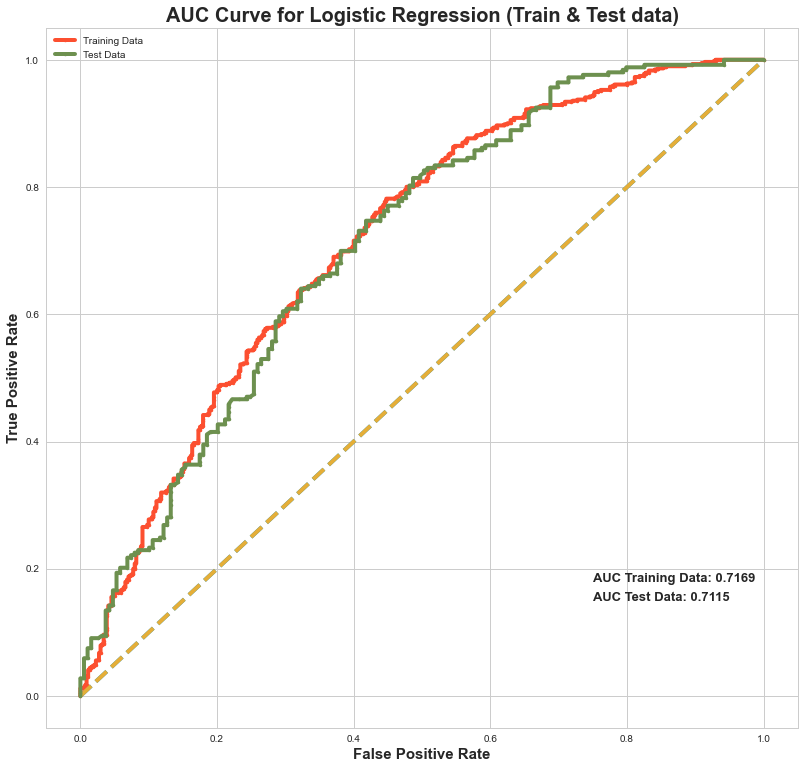

In [686]:
#Train Data Plot
# predict probabilities
probs_train = logistic_model.predict_proba(x_train)

# keep probabilities for the positive outcome only
probs_train = probs_train[:, 1]

# calculate AUC
auc_train = roc_auc_score(y_train, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs_train)
plt.figure(figsize=(12,12))
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(train_fpr, train_tpr,marker='.',label = 'Training Data');



#Test Data Plot
# predict probabilities
probs_test = logistic_model.predict_proba(x_test)

# keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

# calculate AUC
auc_test = roc_auc_score(y_test, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs_test)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(test_fpr, test_tpr, marker='.',label='Test Data');


plt.title("AUC Curve for Logistic Regression (Train & Test data)",fontsize=20, weight="bold");
plt.xlabel("False Positive Rate",fontsize=15,weight="bold")
plt.ylabel("True Positive Rate",fontsize=15,weight="bold")
plt.legend(loc='best')
plt.text(0.75,0.18,f'AUC Training Data: {round(auc_train,4)}',fontsize=13, weight="bold")
plt.text(0.75,0.15,f'AUC Test Data: {round(auc_test,4)}',fontsize=13, weight="bold")
plt.show()


In [687]:
# Performance measures using Classification report on training set
print('Classification Report of the training data:\n\n',classification_report(y_train, ytrain_predict_lr,digits=4))

# Performance measures using Classification report on Test set
print('Classification Report of the test data:\n\n',classification_report(y_test, ytest_predict_lr,digits=4))

Classification Report of the training data:

               precision    recall  f1-score   support

           0     0.6636    0.4932    0.5658       440
           1     0.6832    0.8139    0.7429       591

    accuracy                         0.6770      1031
   macro avg     0.6734    0.6535    0.6543      1031
weighted avg     0.6749    0.6770    0.6673      1031

Classification Report of the test data:

               precision    recall  f1-score   support

           0     0.6842    0.4815    0.5652       189
           1     0.6828    0.8340    0.7509       253

    accuracy                         0.6833       442
   macro avg     0.6835    0.6577    0.6581       442
weighted avg     0.6834    0.6833    0.6715       442



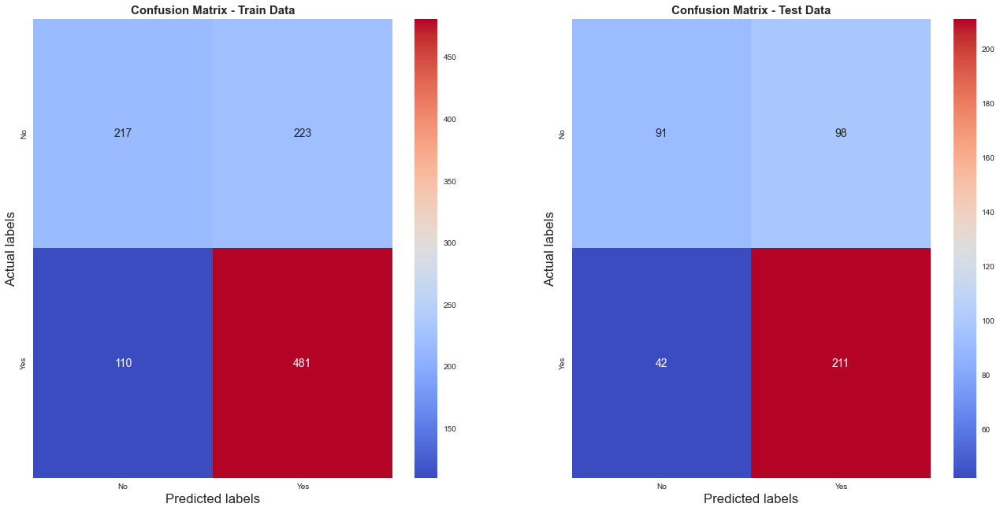

In [688]:
#Plotting confusion matrix for the different models for the Training Data
plt.figure(figsize =(20,10));
plt.subplot(1,2,1); ## Row - Column - Order
plt.title("Confusion Matrix - Train Data",fontsize=15, weight="bold")
sns.heatmap((metrics.confusion_matrix(y_train, ytrain_predict_lr)),annot=True,xticklabels = ["No", "Yes"] , yticklabels = ["No", "Yes"],fmt='.5g',cmap='coolwarm');
plt.ylabel('Actual labels')
plt.xlabel('Predicted labels')


plt.subplot(1,2,2); ## Row - Column - Order
plt.title("Confusion Matrix - Test Data",fontsize=15, weight="bold")
sns.heatmap((metrics.confusion_matrix(y_test, ytest_predict_lr)),annot=True,xticklabels = ["No", "Yes"] , yticklabels = ["No", "Yes"],fmt='.5g',cmap='coolwarm');
plt.ylabel('Actual labels')
plt.xlabel('Predicted labels');

### LDA

In [689]:
print('Number of rows and columns of the training set for the independent variables:',x_train.shape)
print('Number of rows and columns of the training set for the dependent variable:',y_train.shape)
print('Number of rows and columns of the test set for the independent variables:',x_test.shape)
print('Number of rows and columns of the test set for the dependent variable:',y_test.shape)

Number of rows and columns of the training set for the independent variables: (1031, 15)
Number of rows and columns of the training set for the dependent variable: (1031,)
Number of rows and columns of the test set for the independent variables: (442, 15)
Number of rows and columns of the test set for the dependent variable: (442,)


In [690]:
#Build LDA Model
lda_clf = LinearDiscriminantAnalysis()
lda_model = lda_clf.fit(x_train,y_train)

In [691]:
# Training Data Class Prediction with a cut-off value of 0.5
ytrain_predict_lda = lda_model.predict(x_train)

# Test Data Class Prediction with a cut-off value of 0.5
ytest_predict_lda = lda_model.predict(x_test)


In [692]:
#Predict Probability
ytest_predict_prob_lda = lda_model.predict_proba(x_test)
pd.DataFrame(ytest_predict_prob_lda).head()

,0,1
0,0.256110,0.743890
1,0.422685,0.577315
2,0.110356,0.889644
3,0.753665,0.246335
4,0.314103,0.685897


In [693]:
#Accuracy - Train Data
print(f"The Accuracy score (Train data) is {round(lda_model.score(x_train,y_train),4)}")

# Accuracy - Test Data
print(f"The Accuracy score (Test data) is {round(lda_model.score(x_test, y_test),4)}")

The Accuracy score (Train data) is 0.676
The Accuracy score (Test data) is 0.6742


AUC for the Training Data: 0.717
AUC for the Test Data: 0.712


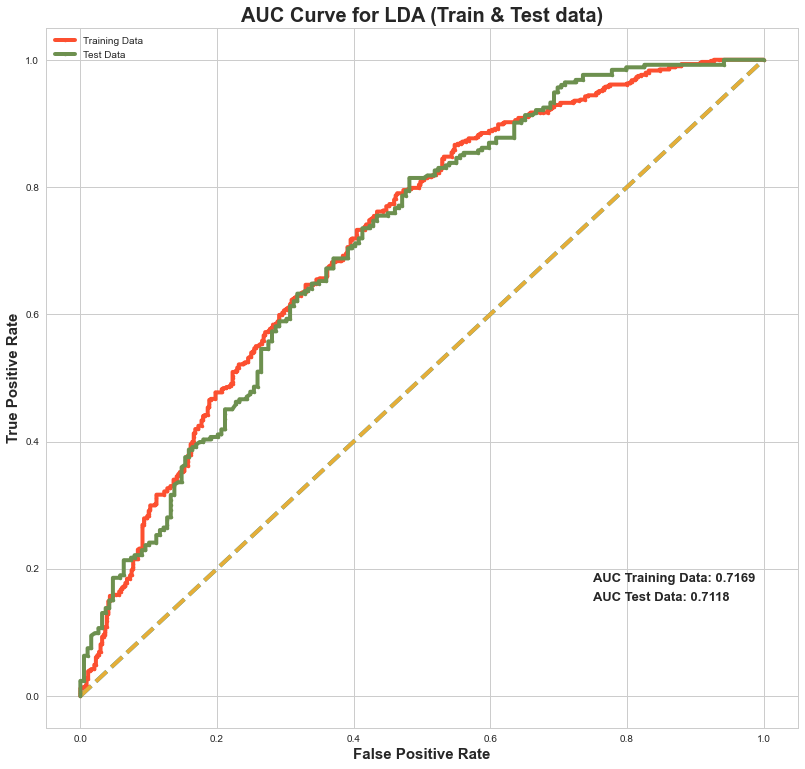

In [694]:
#Train Data Plot
# predict probabilities
probs_train = lda_model.predict_proba(x_train)

# keep probabilities for the positive outcome only
probs_train = probs_train[:, 1]

# calculate AUC
auc_train = roc_auc_score(y_train, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs_train)
plt.figure(figsize=(12,12))
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(train_fpr, train_tpr,marker='.',label = 'Training Data');



#Test Data Plot
# predict probabilities
probs_test = lda_model.predict_proba(x_test)

# keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

# calculate AUC
auc_test = roc_auc_score(y_test, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs_test)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(test_fpr, test_tpr, marker='.',label='Test Data');


plt.title("AUC Curve for LDA (Train & Test data)",fontsize=20, weight="bold");
plt.xlabel("False Positive Rate",fontsize=15,weight="bold")
plt.ylabel("True Positive Rate",fontsize=15,weight="bold")
plt.legend(loc='best')
plt.text(0.75,0.18,f'AUC Training Data: {round(auc_train,4)}',fontsize=13, weight="bold")
plt.text(0.75,0.15,f'AUC Test Data: {round(auc_test,4)}',fontsize=13, weight="bold")
plt.show()

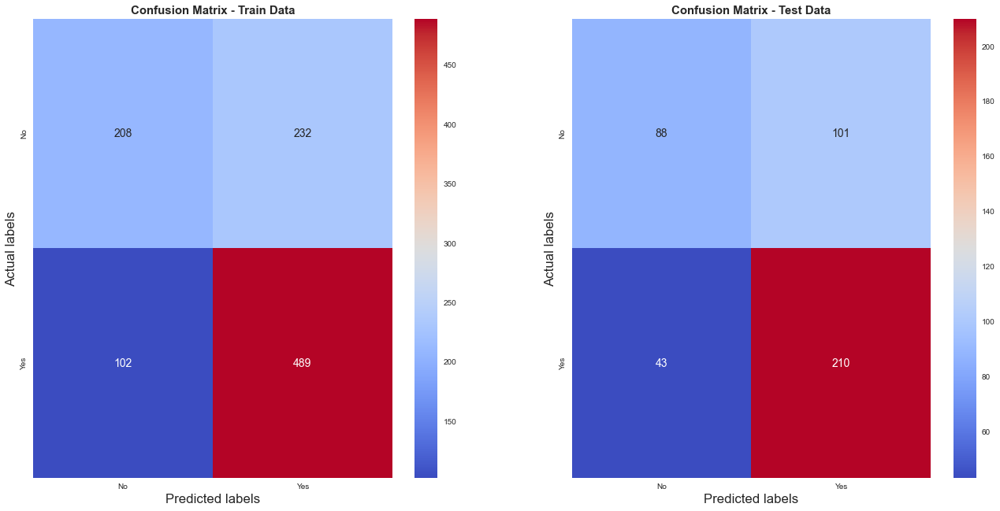

In [695]:
#Plotting confusion matrix for the different models for the Training Data
plt.figure(figsize =(20,10));
plt.subplot(1,2,1); ## Row - Column - Order
plt.title("Confusion Matrix - Train Data",fontsize=15, weight="bold")
sns.heatmap((metrics.confusion_matrix(y_train,ytrain_predict_lda)),annot=True,xticklabels = ["No", "Yes"] , yticklabels = ["No", "Yes"],fmt='.5g',cmap='coolwarm');
plt.ylabel('Actual labels')
plt.xlabel('Predicted labels')


plt.subplot(1,2,2); ## Row - Column - Order
plt.title("Confusion Matrix - Test Data",fontsize=15, weight="bold")
sns.heatmap((metrics.confusion_matrix(y_test,ytest_predict_lda)),annot=True,xticklabels = ["No", "Yes"] , yticklabels = ["No", "Yes"],fmt='.5g',cmap='coolwarm');
plt.ylabel('Actual labels')
plt.xlabel('Predicted labels');

In [696]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,ytrain_predict_lda,digits=4),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,ytest_predict_lda,digits=4),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0     0.6710    0.4727    0.5547       440
           1     0.6782    0.8274    0.7454       591

    accuracy                         0.6760      1031
   macro avg     0.6746    0.6501    0.6500      1031
weighted avg     0.6751    0.6760    0.6640      1031
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0     0.6718    0.4656    0.5500       189
           1     0.6752    0.8300    0.7447       253

    accuracy                         0.6742       442
   macro avg     0.6735    0.6478    0.6473       442
weighted avg     0.6738    0.6742    0.6614       442
 



In [697]:
#Predict Probability
ytrain_predict_prob_lda = lda_model.predict_proba(x_train)
pd.DataFrame(ytrain_predict_prob_lda).head()

,0,1
0,0.184769,0.815231
1,0.289420,0.710580
2,0.137709,0.862291
3,0.280220,0.719780
4,0.921730,0.078270


In [698]:
#Checking For Accuracy with Different Cutoffs

for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_train=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(ytrain_predict_prob_lda[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_train.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
        
    print('Cutoff:', round (j,3),'\t', 'Accuracy:',round(metrics.accuracy_score(y_train,custom_cutoff_train),4), 
          'Recall:',round(metrics.recall_score(y_train,custom_cutoff_train),4), 
          'Precision:',round(metrics.precision_score(y_train,custom_cutoff_train),4), 
          'F1 Score:',round(metrics.f1_score(y_train,custom_cutoff_train),4))

Cutoff: 0.1 	 Accuracy: 0.5887 Recall: 1.0 Precision: 0.5823 F1 Score: 0.736
Cutoff: 0.2 	 Accuracy: 0.6091 Recall: 0.9932 Precision: 0.5953 F1 Score: 0.7445
Cutoff: 0.3 	 Accuracy: 0.6353 Recall: 0.9679 Precision: 0.6157 F1 Score: 0.7526
Cutoff: 0.4 	 Accuracy: 0.6712 Recall: 0.9154 Precision: 0.6518 F1 Score: 0.7614
Cutoff: 0.5 	 Accuracy: 0.676 Recall: 0.8274 Precision: 0.6782 F1 Score: 0.7454
Cutoff: 0.6 	 Accuracy: 0.6499 Recall: 0.6565 Precision: 0.7106 F1 Score: 0.6825
Cutoff: 0.7 	 Accuracy: 0.5955 Recall: 0.4196 Precision: 0.7702 F1 Score: 0.5433
Cutoff: 0.8 	 Accuracy: 0.4985 Recall: 0.1574 Precision: 0.8304 F1 Score: 0.2646
Cutoff: 0.9 	 Accuracy: 0.4326 Recall: 0.0102 Precision: 1.0 F1 Score: 0.0201


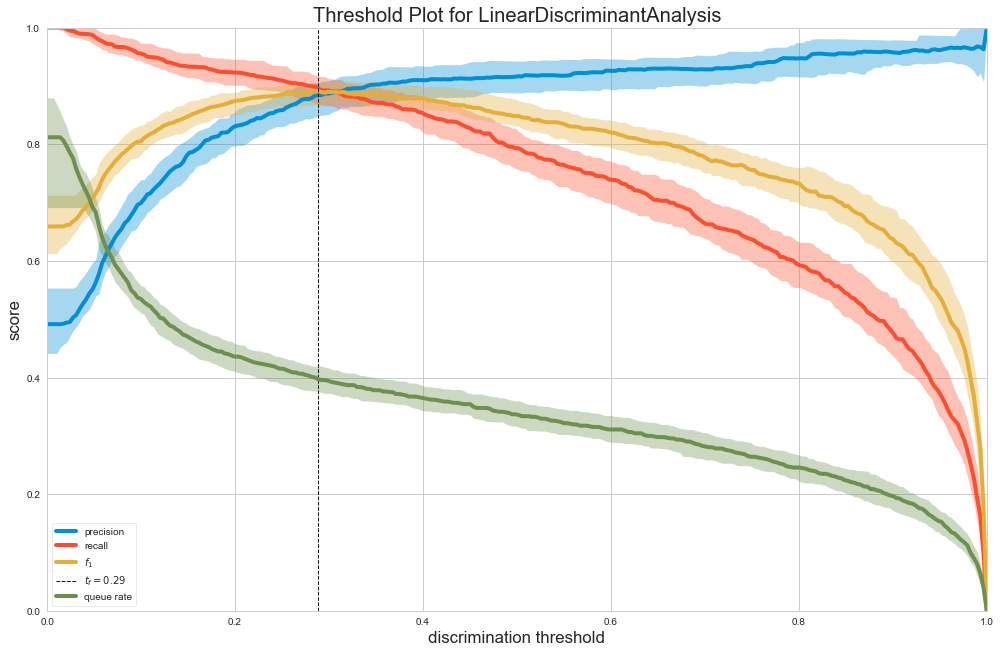

In [699]:
x_train,y_train = load_spam()

plt.figure(figsize =(15,10));
visualizer = DiscriminationThreshold(lda_model)
visualizer.fit(x_train,y_train) 
visualizer.show();

### CART

In [700]:
# Using for loops to convert categorical colmns into integer
for feature in cmethod_df.columns: 
    if cmethod_df[feature].dtype == 'object': 
        print('\n')
        print('feature:',feature)
        print(pd.Categorical(cmethod_df[feature].unique()))
        print(pd.Categorical(cmethod_df[feature].unique()).codes)
        cmethod_df[feature] = pd.Categorical(cmethod_df[feature]).codes



feature: Wife_ education
['Primary', 'Uneducated', 'Secondary', 'Tertiary']
Categories (4, object): ['Primary', 'Secondary', 'Tertiary', 'Uneducated']
[0 3 1 2]


feature: Husband_education
['Secondary', 'Primary', 'Tertiary', 'Uneducated']
Categories (4, object): ['Primary', 'Secondary', 'Tertiary', 'Uneducated']
[1 0 2 3]


feature: Wife_religion
['Scientology', 'Non-Scientology']
Categories (2, object): ['Non-Scientology', 'Scientology']
[1 0]


feature: Wife_Working
['No', 'Yes']
Categories (2, object): ['No', 'Yes']
[0 1]


feature: Standard_of_living_index
['High', 'Very High', 'Low', 'Very Low']
Categories (4, object): ['High', 'Low', 'Very High', 'Very Low']
[0 2 1 3]


feature: Media_exposure 
['Exposed', 'Not-Exposed']
Categories (2, object): ['Exposed', 'Not-Exposed']
[0 1]


In [701]:
cmethod_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   int8   
 2   Husband_education          1473 non-null   int8   
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   int8   
 5   Wife_Working               1473 non-null   int8   
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   int8   
 8   Media_exposure             1473 non-null   int8   
 9   Contraceptive_method_used  1473 non-null   int32  
dtypes: float64(2), int32(1), int64(1), int8(6)
memory usage: 49.0 KB


In [702]:
cmethod_df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,0,1,3.0,1,0,2,0,0,0
1,45.0,3,1,8.5,1,0,3,2,0,0
2,43.0,0,1,7.0,1,0,3,2,0,0
3,42.0,1,0,8.5,1,0,3,0,0,0
4,36.0,1,1,8.0,1,0,3,1,0,0


In [703]:
# Checking the ratio of dependent variables
cmethod_df.Contraceptive_method_used.value_counts(normalize=True)

1    0.57298
0    0.42702
Name: Contraceptive_method_used, dtype: float64

In [704]:
# Seperating the dependent and independent variables
x_cart = cmethod_df.drop("Contraceptive_method_used", axis=1)

y_cart = cmethod_df.pop("Contraceptive_method_used")

x_cart.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
0,24.0,0,1,3.0,1,0,2,0,0
1,45.0,3,1,8.5,1,0,3,2,0
2,43.0,0,1,7.0,1,0,3,2,0
3,42.0,1,0,8.5,1,0,3,0,0
4,36.0,1,1,8.0,1,0,3,1,0


In [705]:
y_cart.head()

0    0
1    0
2    0
3    0
4    0
Name: Contraceptive_method_used, dtype: int32

In [706]:
# Splitting the dataset into 70:30 ratio
x_train_cart, x_test_cart, train_labels_cart, test_labels_cart = train_test_split(x_cart, y_cart, test_size=.30, random_state=0)

In [707]:
# Initialise a Decision Tree Classifier
dt_model = DecisionTreeClassifier(criterion = 'gini', random_state=0)

In [708]:
# Fit the model
dt_model.fit(x_train_cart, train_labels_cart)

DecisionTreeClassifier(random_state=0)

In [709]:
text_representation = tree.export_text(dt_model)

In [710]:
# Building a tree from dot file
train_char_label = ['No', 'Yes']
cmethod_Tree_File = open('cmethod_Tree_File.dot','w')
dot_data = tree.export_graphviz(dt_model, 
                                out_file=cmethod_Tree_File, 
                                feature_names = list(x_train_cart), 
                                class_names = list(train_char_label))

cmethod_Tree_File.close()

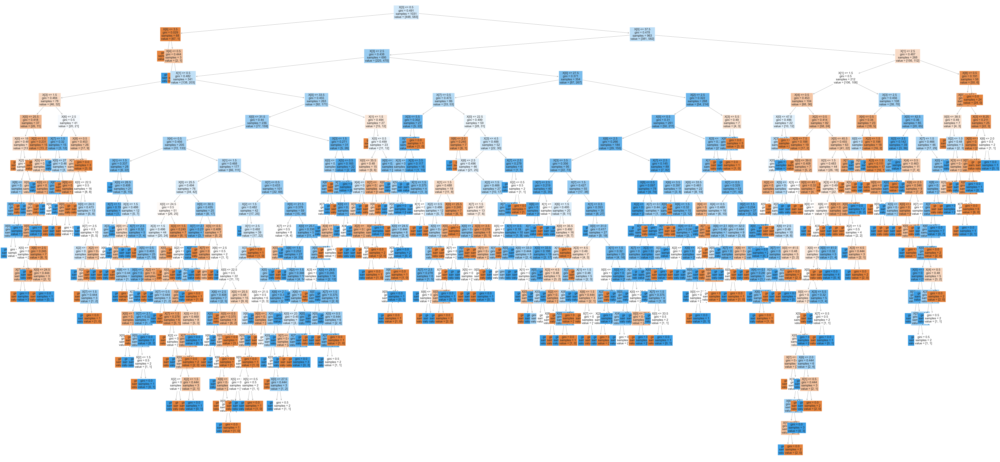

In [711]:
# Alternative method - Without Webgraphviz
plt.figure(figsize =(80,40))
tree.plot_tree(dt_model,filled =True, fontsize =15);

In [712]:
# Important features in your dataset
Feature_imp = pd.DataFrame()
Feature_imp["Features"]= x_train_cart.columns
Feature_imp['Importance'] = round(pd.Series(dt_model.feature_importances_),3)
Feature_imp_sorted = Feature_imp.sort_values(by ="Importance", ascending =False)
Feature_imp_sorted

,Features,Importance
0,Wife_age,0.299
3,No_of_children_born,0.233
1,Wife_ education,0.107
6,Husband_Occupation,0.098
7,Standard_of_living_index,0.097
2,Husband_education,0.066
5,Wife_Working,0.048
4,Wife_religion,0.035
8,Media_exposure,0.016


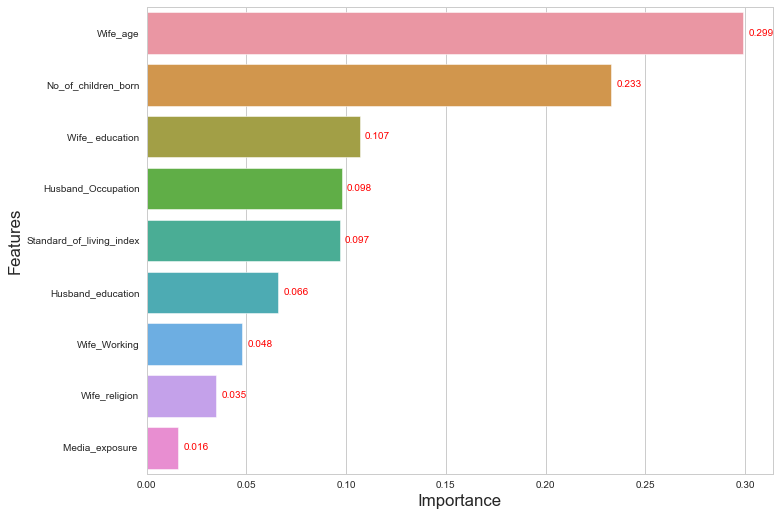

In [713]:
# Visualising the Feature Importance
plt.figure(figsize=(10,8))
ax = sns.barplot(x = "Importance", y = "Features", data =Feature_imp_sorted);
ax.bar_label(ax.containers[0], label_type='edge', color = 'red',rotation =0, fontsize = 10,padding =5);

In [714]:
# Applying the model on test data
y_predict_cart = dt_model.predict(x_test_cart)

In [715]:
# Exploring Parameters- Learn from data
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth=5, random_state=0)
reg_dt_model.fit(x_train_cart, train_labels_cart)

DecisionTreeClassifier(max_depth=5, random_state=0)

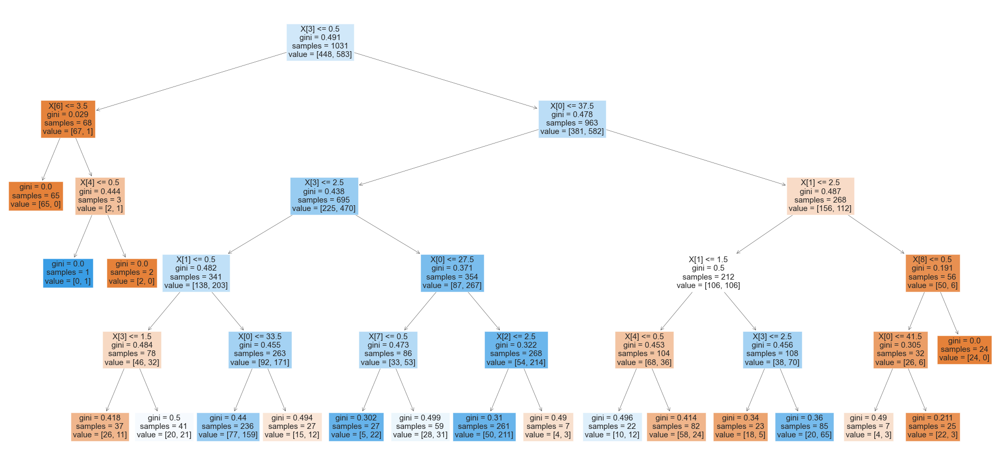

In [727]:
plt.figure(figsize =(30,15))
tree.plot_tree(reg_dt_model,filled =True, fontsize =15);

In [717]:
# Important features in your dataset
Feature_imp_reg = pd.DataFrame()
Feature_imp_reg["Features"]= x_train_cart.columns
Feature_imp_reg['Importance'] = round(pd.Series(reg_dt_model.feature_importances_),3)
Feature_imp_reg_sorted = Feature_imp_reg.sort_values(by ="Importance", ascending =False)
Feature_imp_reg_sorted

,Features,Importance
3,No_of_children_born,0.469
0,Wife_age,0.241
1,Wife_ education,0.216
4,Wife_religion,0.025
7,Standard_of_living_index,0.022
2,Husband_education,0.014
8,Media_exposure,0.007
6,Husband_Occupation,0.005
5,Wife_Working,0.000


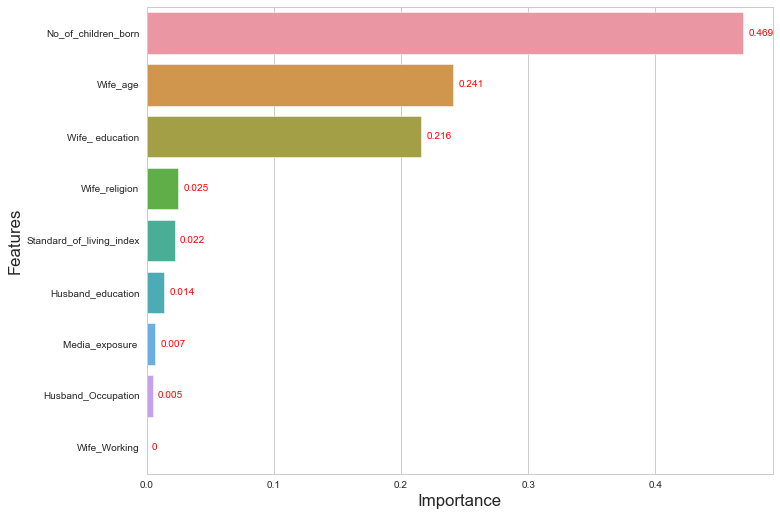

In [718]:
# Visualising the Feature Importance
plt.figure(figsize=(10,8))
ax = sns.barplot(x = "Importance", y = "Features", data =Feature_imp_reg_sorted);
ax.bar_label(ax.containers[0], label_type='edge', color = 'red',rotation =0, fontsize = 10,padding =5);

In [719]:
ytrain_predict_cart = reg_dt_model.predict(x_train_cart)
ytest_predict_cart = reg_dt_model.predict(x_test_cart)

In [720]:
#Accuracy - Train Data
print(f"The Accuracy score (Train data) is {round(reg_dt_model.score(x_train_cart,train_labels_cart),4)}")

# Accuracy - Test Data
print(f"The Accuracy score (Test data) is {round(reg_dt_model.score(x_test_cart, test_labels_cart),4)}")

The Accuracy score (Train data) is 0.7371
The Accuracy score (Test data) is 0.7195


AUC for the Training Data: 0.784
AUC for the Test Data: 0.739


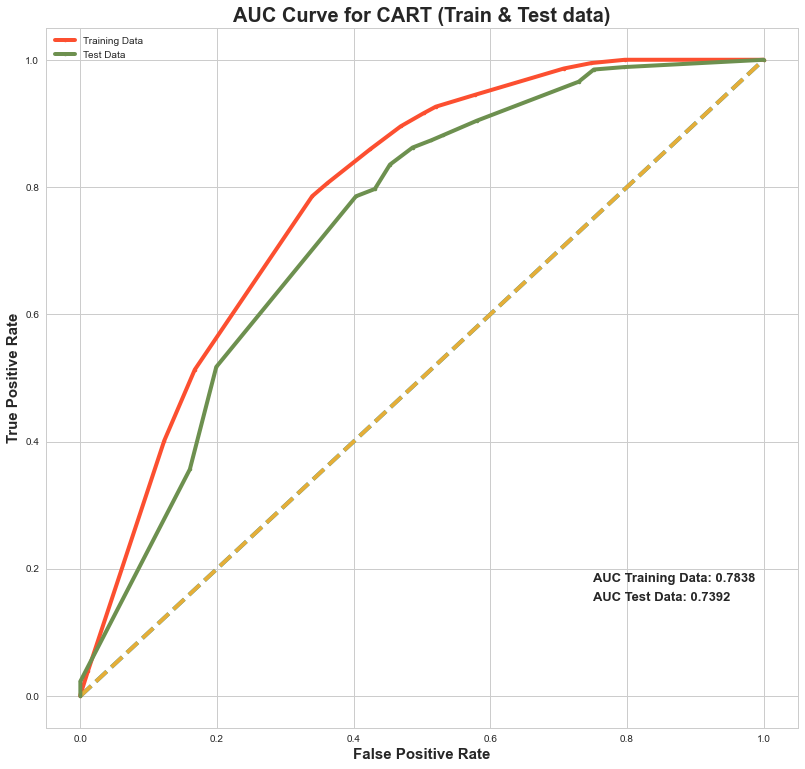

In [721]:
#Train Data Plot
# predict probabilities
probs_train = reg_dt_model.predict_proba(x_train_cart)

# keep probabilities for the positive outcome only
probs_train = probs_train[:, 1]

# calculate AUC
auc_train = roc_auc_score(train_labels_cart, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(train_labels_cart, probs_train)
plt.figure(figsize=(12,12))
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(train_fpr, train_tpr,marker='.',label = 'Training Data');



#Test Data Plot
# predict probabilities
probs_test = reg_dt_model.predict_proba(x_test_cart)

# keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

# calculate AUC
auc_test = roc_auc_score(test_labels_cart, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(test_labels_cart, probs_test)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(test_fpr, test_tpr, marker='.',label='Test Data');


plt.title("AUC Curve for CART (Train & Test data)",fontsize=20, weight="bold");
plt.xlabel("False Positive Rate",fontsize=15,weight="bold")
plt.ylabel("True Positive Rate",fontsize=15,weight="bold")
plt.legend(loc='best')
plt.text(0.75,0.18,f'AUC Training Data: {round(auc_train,4)}',fontsize=13, weight="bold")
plt.text(0.75,0.15,f'AUC Test Data: {round(auc_test,4)}',fontsize=13, weight="bold")
plt.show()

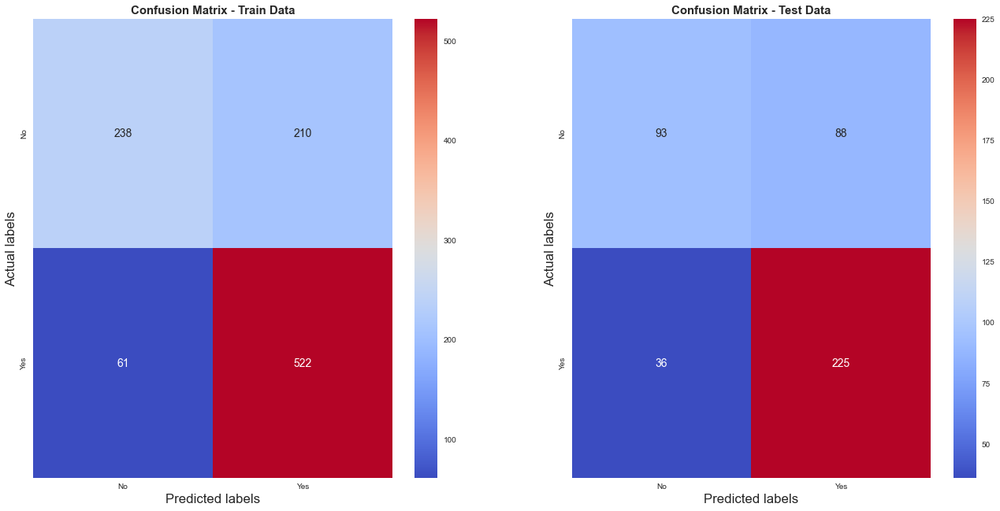

In [722]:
#Plotting confusion matrix for the different models for the Training Data
plt.figure(figsize =(20,10));
plt.subplot(1,2,1); ## Row - Column - Order
plt.title("Confusion Matrix - Train Data",fontsize=15, weight="bold")
sns.heatmap((metrics.confusion_matrix(train_labels_cart,ytrain_predict_cart)),annot=True,xticklabels = ["No", "Yes"] , yticklabels = ["No", "Yes"],fmt='.5g',cmap='coolwarm');
plt.ylabel('Actual labels')
plt.xlabel('Predicted labels')


plt.subplot(1,2,2); ## Row - Column - Order
plt.title("Confusion Matrix - Test Data",fontsize=15, weight="bold")
sns.heatmap((metrics.confusion_matrix(test_labels_cart,ytest_predict_cart)),annot=True,xticklabels = ["No", "Yes"] , yticklabels = ["No", "Yes"],fmt='.5g',cmap='coolwarm');
plt.ylabel('Actual labels')
plt.xlabel('Predicted labels');

In [723]:
print('Classification Report of the training data:\n\n',metrics.classification_report(train_labels_cart,ytrain_predict_cart,digits=4),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(test_labels_cart,ytest_predict_cart,digits=4),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0     0.7960    0.5312    0.6372       448
           1     0.7131    0.8954    0.7939       583

    accuracy                         0.7371      1031
   macro avg     0.7546    0.7133    0.7156      1031
weighted avg     0.7491    0.7371    0.7258      1031
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0     0.7209    0.5138    0.6000       181
           1     0.7188    0.8621    0.7840       261

    accuracy                         0.7195       442
   macro avg     0.7199    0.6879    0.6920       442
weighted avg     0.7197    0.7195    0.7086       442
 

